Overview
Description
No description added
Summary

Citation Request:
This dataset is public available for research. The details are described in [Cortez et al., 2009].
Please include this citation if you plan to use this database:

P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis.
Modeling wine preferences by data mining from physicochemical properties.
In Decision Support Systems, Elsevier, 47(4):547-553. ISSN: 0167-9236.

Available at: [@Elsevier] http://dx.doi.org/10.1016/j.dss.2009.05.016
[Pre-press (pdf)] http://www3.dsi.uminho.pt/pcortez/winequality09.pdf
[bib] http://www3.dsi.uminho.pt/pcortez/dss09.bib

    Title: Wine Quality

    Sources
    Created by: Paulo Cortez (Univ. Minho), Antonio Cerdeira, Fernando Almeida, Telmo Matos and Jose Reis (CVRVV) @ 2009

    Past Usage:

P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis.
Modeling wine preferences by data mining from physicochemical properties.
In Decision Support Systems, Elsevier, 47(4):547-553. ISSN: 0167-9236.

In the above reference, two datasets were created, using red and white wine samples.
The inputs include objective tests (e.g. PH values) and the output is based on sensory data
(median of at least 3 evaluations made by wine experts). Each expert graded the wine quality
between 0 (very bad) and 10 (very excellent). Several data mining methods were applied to model
these datasets under a regression approach. The support vector machine model achieved the
best results. Several metrics were computed: MAD, confusion matrix for a fixed error tolerance (T),
etc. Also, we plot the relative importances of the input variables (as measured by a sensitivity
analysis procedure).

    Relevant Information:

    The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine.
    For more details, consult: http://www.vinhoverde.pt/en/ or the reference [Cortez et al., 2009].
    Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables
    are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

    These datasets can be viewed as classification or regression tasks.
    The classes are ordered and not balanced (e.g. there are munch more normal wines than
    excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent
    or poor wines. Also, we are not sure if all input variables are relevant. So
    it could be interesting to test feature selection methods.

    Number of Instances: red wine - 1599; white wine - 4898.

    Number of Attributes: 11 + output attribute

    Note: several of the attributes may be correlated, thus it makes sense to apply some sort of
    feature selection.

    Attribute information:

    For more information, read [Cortez et al., 2009].

    Input variables (based on physicochemical tests):
    1 - fixed acidity
    2 - volatile acidity
    3 - citric acid
    4 - residual sugar
    5 - chlorides
    6 - free sulfur dioxide
    7 - total sulfur dioxide
    8 - density
    9 - pH
    10 - sulphates
    11 - alcohol
    Output variable (based on sensory data):
    12 - quality (score between 0 and 10)

    Missing Attribute Values: None

Source: UCI


Data Acquisition: Data is collected from Data.World Wine Quality Dataset
Data Prep: The red and white csv's should be combined and a column added for whether each observation is a red or white wine
Data Prep: Column data types are appropriate for the data they contain
Data Prep: Missing values are investigated and handled
Data Prep: Outliers are investigated and handled
Exploration: the interaction between independent variables and the target variable is explored using visualization and statistical testing
Exploration: Clustering is used to explore the data. A conclusion, supported by statistical testing and visualization, is drawn on whether or not the clusters are helpful/useful. At least 3 combinations of features for clustering should be tried.
Modeling: At least 4 different models are created and their performance is compared. One model is the distinct combination of algorithm, hyperparameters, and features.
Best practices on data splitting are followed
The final notebook has a good title and the documentation within is sufficiently explanatory and of high quality
Decisions and judgment calls are made and explained/documented
All python code is of high quality

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.cluster import KMeans

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from scipy.stats import pearsonr, ttest_ind, chi2_contingency, f_oneway
import wrangle

In [2]:
#ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Visualizing
%matplotlib inline

# default pandas decimal number display format
pd.options.display.float_format = '{:20,.2f}'.format

In [4]:
import pandas as pd
df_red = pd.read_csv('https://query.data.world/s/qotfdduujswyksjibixmjkel5tg64q?dws=00000')

In [5]:
import pandas as pd
df_white = pd.read_csv('https://query.data.world/s/4chhaebvrfvrupasevbcqp5ubx62us?dws=00000')

In [6]:
# Add a 'type' column to each dataframe
df_red['type'] = 'red'
df_white['type'] = 'white'# Calculate the mean of each row


# Combine the red and white dataframes into a single dataframe
df = pd.concat([df_red, df_white], ignore_index=True)

In [7]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,red
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,red
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,red
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,red
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,white
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,white
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,white
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,white


In [8]:
pivoted_df = df.pivot_table(values=['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides',
                                    'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates',
                                    'alcohol'],
                             index='quality',
                             columns='alcohol')

In [9]:
pivoted_df 

chlorides                                            \
alcohol                 8.00                 8.40                 8.50   
quality                                                                  
3                       0.04                 0.20                 0.07   
4                        NaN                 0.06                  NaN   
5                       0.03                 0.05                 0.09   
6                        NaN                 0.07                 0.05   
7                        NaN                  NaN                  NaN   
8                        NaN                  NaN                 0.04   
9                        NaN                  NaN                  NaN   

                                                                        \
alcohol                 8.60                 8.70                 8.80   
quality                                                                  
3                        NaN                  NaN                  NaN   
4                       0.05                 0.07                 0.05   
5                       0.05                 0.05                 0.06   
6                       0.08                 0.06                 0.05   
7                       0.04                 0.05                 0.04   
8                        NaN                  NaN                 0.06   
9                        NaN                  NaN                  NaN   

                                                                        \
alcohol                 8.90                 9.00                 9.05   
quality                                                                  
3                        NaN                 0.07                  NaN   
4                       0.05                 0.08                 0.08   
5                       0.05                 0.06                  NaN   
6                       0.05                 0.07                  NaN   
7                       0.05                 0.06                  NaN   
8                       0.06                  NaN                  NaN   
9                        NaN                  NaN                  NaN   

                              ...     volatile acidity                       \
alcohol                 9.10  ...                13.55                13.57   
quality                       ...                                             
3                       0.15  ...                  NaN                  NaN   
4                       0.06  ...                  NaN                  NaN   
5                       0.06  ...                  NaN                  NaN   
6                       0.08  ...                 0.62                  NaN   
7                       0.05  ...                  NaN                 0.47   
8                        NaN  ...                  NaN                  NaN   
9                        NaN  ...                  NaN                  NaN   

                                                                        \
alcohol                13.60                13.70                13.80   
quality                                                                  
3                        NaN                  NaN                  NaN   
4                        NaN                  NaN                  NaN   
5                       0.67                  NaN                  NaN   
6                       0.38                  NaN                 0.53   
7                       0.37                 0.40                  NaN   
8                        NaN                  NaN                  NaN   
9                        NaN                  NaN                  NaN   

                                                                        \
alcohol                13.90                14.00                14.05   
quality                                                                  
3                        NaN              

In [10]:
# group the DataFrame by quality and type
grouped_df = df.groupby(['quality', 'type'])

# calculate the mean for each group
mean_df = grouped_df.mean()

# reset the index to make quality and type columns again
mean_df = mean_df.reset_index()

In [11]:
mean_df

,quality,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,3,red,8.36,0.88,0.17,2.64,0.12,11.00,24.90,1.00,3.40,0.57,9.96
1,3,white,7.60,0.33,0.34,6.39,0.05,53.33,170.60,0.99,3.19,0.47,10.35
2,4,red,7.78,0.69,0.17,2.69,0.09,12.26,36.25,1.00,3.38,0.60,10.27
3,4,white,7.13,0.38,0.30,4.63,0.05,23.36,125.28,0.99,3.18,0.48,10.15
4,5,red,8.17,0.58,0.24,2.53,0.09,16.98,56.51,1.00,3.30,0.62,9.90
5,5,white,6.93,0.30,0.34,7.33,0.05,36.43,150.90,1.00,3.17,0.48,9.81
6,6,red,8.35,0.50,0.27,2.48,0.08,15.71,40.87,1.00,3.32,0.68,10.63
7,6,white,6.84,0.26,0.34,6.44,0.05,35.65,137.05,0.99,3.19,0.49,10.58
8,7,red,8.87,0.40,0.38,2.72,0.08,14.05,35.02,1.00,3.29,0.74,11.47
9,7,white,6.73,0.26,0.33,5.19,0.04,34.13,125.11,0.99,3.21,0.50,11.37


In [12]:
# group the DataFrame by quality and type
grouped_df = df.groupby(['quality', 'type'])

# filter out quality 3-6
filtered_df = grouped_df.filter(lambda x: x['quality'].iloc[0] not in range(3, 7))

# calculate the mean for each group
mean_df = filtered_df.groupby(['quality', 'type']).mean().reset_index()

In [13]:
mean_df 

,quality,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7,red,8.87,0.40,0.38,2.72,0.08,14.05,35.02,1.00,3.29,0.74,11.47
1,7,white,6.73,0.26,0.33,5.19,0.04,34.13,125.11,0.99,3.21,0.50,11.37
2,8,red,8.57,0.42,0.39,2.58,0.07,13.28,33.44,1.00,3.27,0.77,12.09
3,8,white,6.66,0.28,0.33,5.67,0.04,36.72,126.17,0.99,3.22,0.49,11.64
4,9,white,7.42,0.30,0.39,4.12,0.03,33.40,116.00,0.99,3.31,0.47,12.18


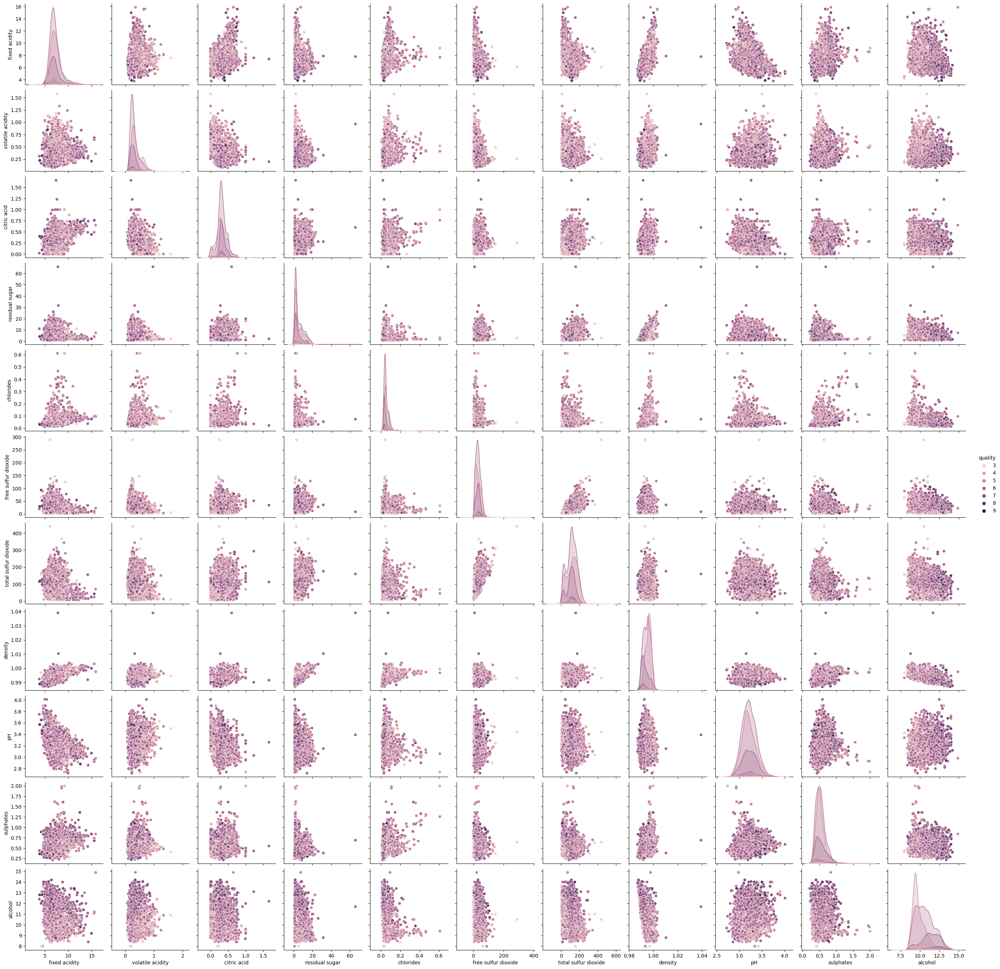

In [14]:
sns.pairplot(data=df, vars=['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol'], hue='quality')
plt.show()

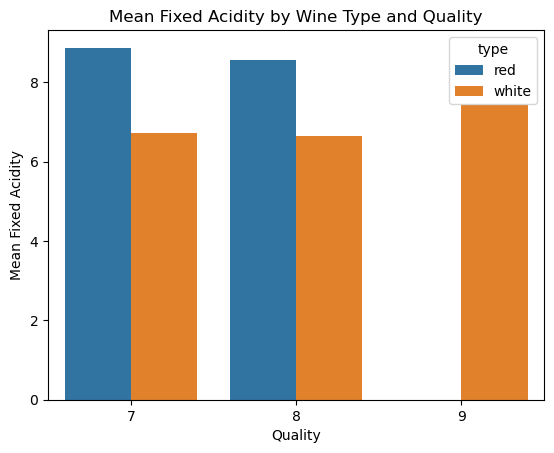

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.barplot(x='quality', y='fixed acidity', hue='type', data=mean_df.groupby(['quality', 'type']).mean().reset_index())
plt.title('Mean Fixed Acidity by Wine Type and Quality')
plt.xlabel('Quality')
plt.ylabel('Mean Fixed Acidity')
plt.show()

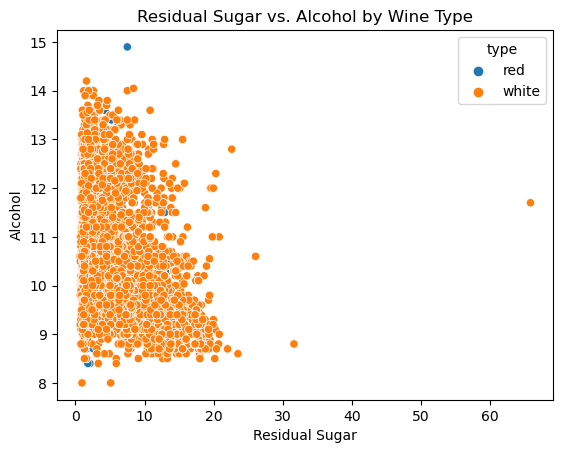

In [16]:
sns.scatterplot(x='residual sugar', y='alcohol', hue='type', data=df)
plt.title('Residual Sugar vs. Alcohol by Wine Type')
plt.xlabel('Residual Sugar')
plt.ylabel('Alcohol')
plt.show()

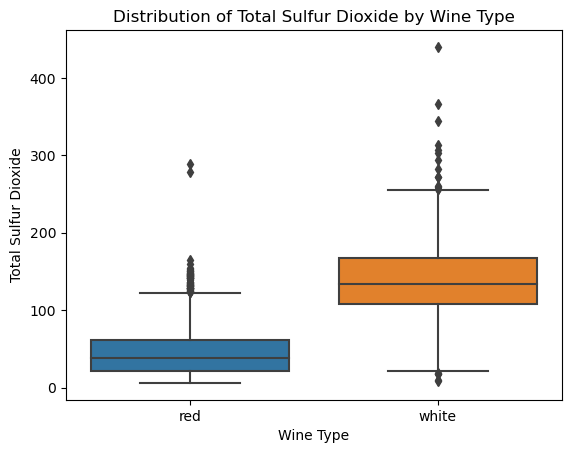

In [17]:
sns.boxplot(x='type', y='total sulfur dioxide', data=df)
plt.title('Distribution of Total Sulfur Dioxide by Wine Type')
plt.xlabel('Wine Type')
plt.ylabel('Total Sulfur Dioxide')
plt.show()

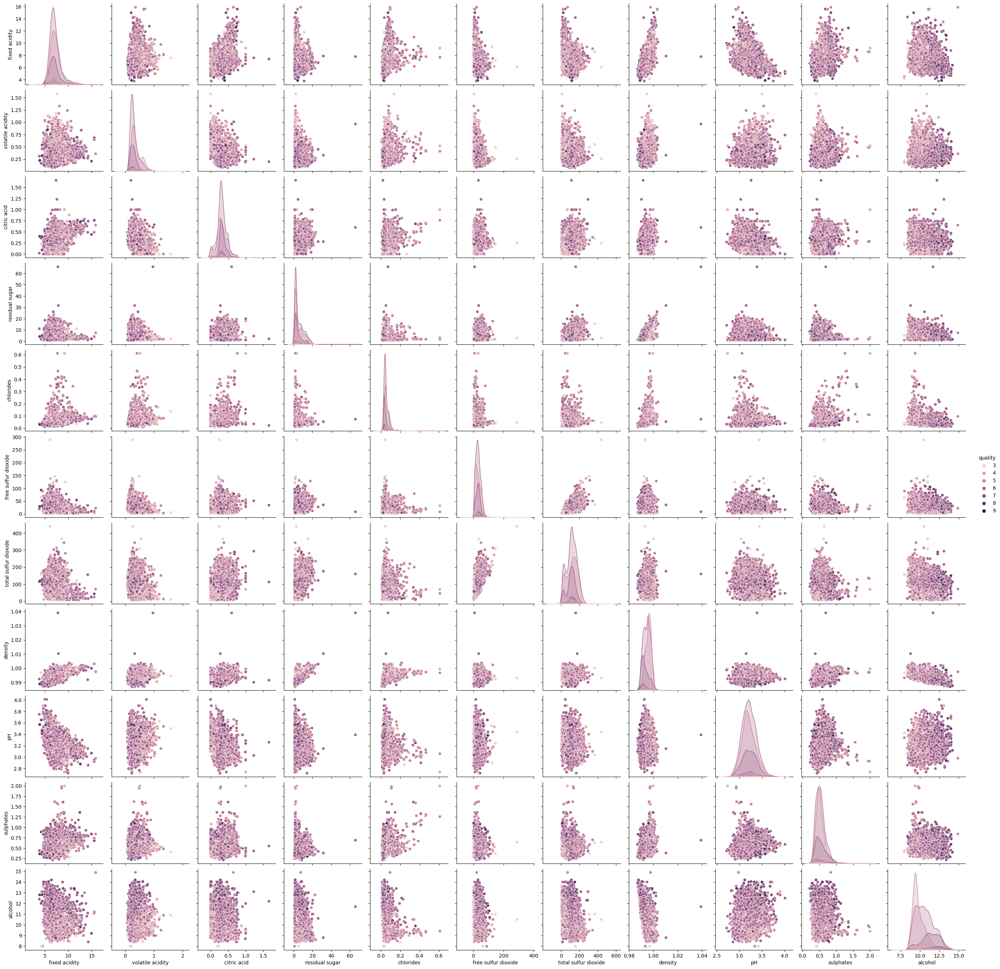

In [18]:
sns.pairplot(data=df, vars=['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol'], hue='quality')
plt.show()

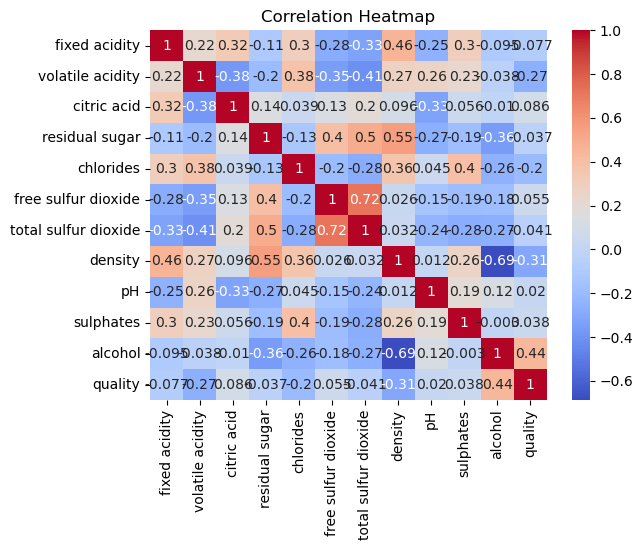

In [19]:
sns.heatmap(df.corr(), cmap='coolwarm', annot=True)
plt.title('Correlation Heatmap')
plt.show()

In [20]:
pivoted_df['mean'] = pivoted_df.mean(axis=1)
pivoted_df = pivoted_df .rename(columns={'mean': 'wine{}'.format(len(pivoted_df.columns))})

In [21]:
pivoted_df 

chlorides                                            \
alcohol                  8.0                  8.4                  8.5   
quality                                                                  
3                       0.04                 0.20                 0.07   
4                        NaN                 0.06                  NaN   
5                       0.03                 0.05                 0.09   
6                        NaN                 0.07                 0.05   
7                        NaN                  NaN                  NaN   
8                        NaN                  NaN                 0.04   
9                        NaN                  NaN                  NaN   

                                                                        \
alcohol                  8.6                  8.7                  8.8   
quality                                                                  
3                        NaN                  NaN                  NaN   
4                       0.05                 0.07                 0.05   
5                       0.05                 0.05                 0.06   
6                       0.08                 0.06                 0.05   
7                       0.04                 0.05                 0.04   
8                        NaN                  NaN                 0.06   
9                        NaN                  NaN                  NaN   

                                                                        \
alcohol                  8.9                  9.0                 9.05   
quality                                                                  
3                        NaN                 0.07                  NaN   
4                       0.05                 0.08                 0.08   
5                       0.05                 0.06                  NaN   
6                       0.05                 0.07                  NaN   
7                       0.05                 0.06                  NaN   
8                       0.06                  NaN                  NaN   
9                        NaN                  NaN                  NaN   

                              ...     volatile acidity                       \
alcohol                  9.1  ...          13.56666667                 13.6   
quality                       ...                                             
3                       0.15  ...                  NaN                  NaN   
4                       0.06  ...                  NaN                  NaN   
5                       0.06  ...                  NaN                 0.67   
6                       0.08  ...                  NaN                 0.38   
7                       0.05  ...                 0.47                 0.37   
8                        NaN  ...                  NaN                  NaN   
9                        NaN  ...                  NaN                  NaN   

                                                                        \
alcohol                 13.7                 13.8                 13.9   
quality                                                                  
3                        NaN                  NaN                  NaN   
4                        NaN                  NaN                  NaN   
5                        NaN                  NaN                  NaN   
6                        NaN                 0.53                  NaN   
7                       0.40                  NaN                 0.30   
8                        NaN                  NaN                  NaN   
9                        NaN                  NaN                  NaN   

                                                                        \
alcohol                 14.0                14.05                 14.2   
quality                                                                  
3                        NaN              

In [22]:
pivoted_df.mean()

                  alcohol
chlorides         8.0                       0.04
                  8.4                       0.10
                  8.5                       0.06
                  8.6                       0.06
                  8.7                       0.06
                                    ...         
volatile acidity  14.0                      0.40
                  14.05                     0.61
                  14.2                      0.35
                  14.9                      0.36
wine1111                                   15.42
Length: 1111, dtype: float64

In [23]:
means_df = pd.DataFrame(pivoted_df.mean())
means_df.columns = ['mean_value']

In [24]:
means_df

mean_value
                 alcohol                     
chlorides        8.0                     0.04
                 8.4                     0.10
                 8.5                     0.06
                 8.6                     0.06
                 8.7                     0.06
...                                       ...
volatile acidity 14.0                    0.40
                 14.05                   0.61
                 14.2                    0.35
                 14.9                    0.36
wine1111                                15.42

[1111 rows x 1 columns]

In [25]:
# Plot a heatmap of the correlation matrix
corr_matrix = df.corr()

In [26]:
corr_matrix

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.00,0.22,0.32,-0.11,0.30,-0.28,-0.33,0.46,-0.25,0.30,-0.10,-0.08
volatile acidity,0.22,1.00,-0.38,-0.20,0.38,-0.35,-0.41,0.27,0.26,0.23,-0.04,-0.27
citric acid,0.32,-0.38,1.00,0.14,0.04,0.13,0.20,0.10,-0.33,0.06,-0.01,0.09
residual sugar,-0.11,-0.20,0.14,1.00,-0.13,0.40,0.50,0.55,-0.27,-0.19,-0.36,-0.04
chlorides,0.30,0.38,0.04,-0.13,1.00,-0.20,-0.28,0.36,0.04,0.40,-0.26,-0.20
free sulfur dioxide,-0.28,-0.35,0.13,0.40,-0.20,1.00,0.72,0.03,-0.15,-0.19,-0.18,0.06
total sulfur dioxide,-0.33,-0.41,0.20,0.50,-0.28,0.72,1.00,0.03,-0.24,-0.28,-0.27,-0.04
density,0.46,0.27,0.10,0.55,0.36,0.03,0.03,1.00,0.01,0.26,-0.69,-0.31
pH,-0.25,0.26,-0.33,-0.27,0.04,-0.15,-0.24,0.01,1.00,0.19,0.12,0.02
sulphates,0.30,0.23,0.06,-0.19,0.40,-0.19,-0.28,0.26,0.19,1.00,-0.00,0.04


In [27]:
wrangle.custom_describe(df)

NameError: name 'distribution_type' is not defined

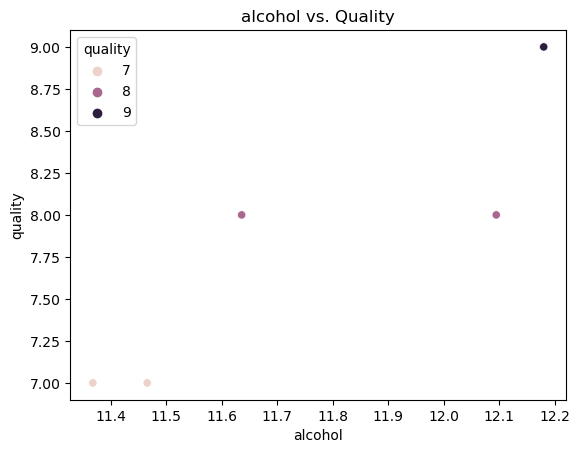

In [28]:
# Plot a scatter plot of alcohol content vs. wine quality
sns.scatterplot(x='alcohol', y='quality', hue='quality',data=mean_df)
plt.title('alcohol vs. Quality')
plt.show()

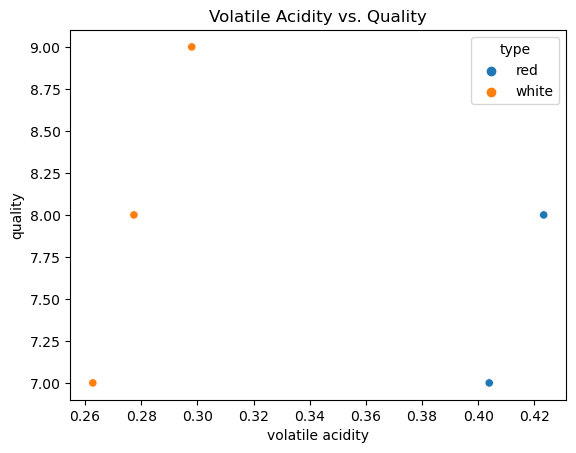

In [29]:
# Plot a scatter plot of volatile acidity vs. wine quality
sns.scatterplot(x='volatile acidity', y='quality', hue='type', data=mean_df)
plt.title('Volatile Acidity vs. Quality')
plt.show()

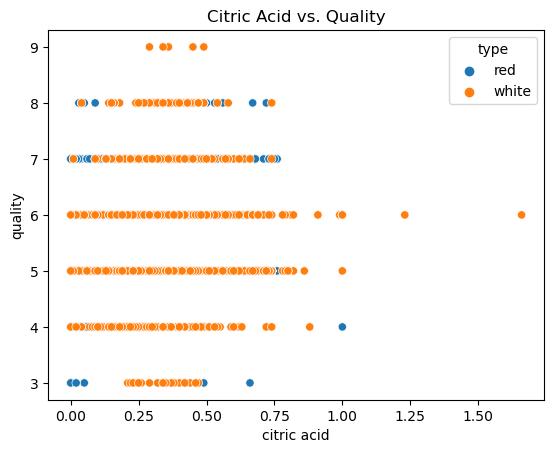

In [30]:
# Plot a scatter plot of citric acid vs. wine quality
sns.scatterplot(x='citric acid', y='quality', hue='type', data=df)
plt.title('Citric Acid vs. Quality')
plt.show()

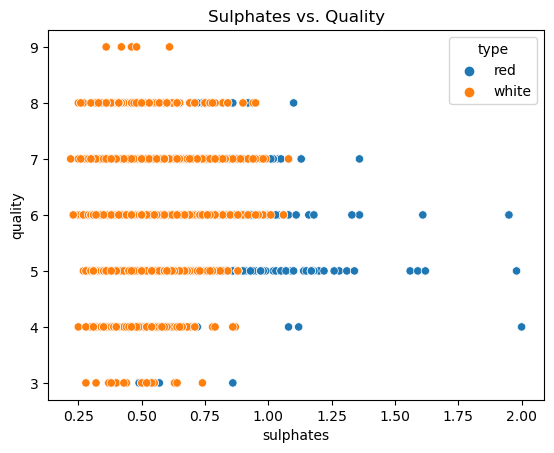

In [31]:
# Plot a scatter plot of sulphates vs. wine quality
sns.scatterplot(x='sulphates', y='quality', hue='type', data=df)
plt.title('Sulphates vs. Quality')
plt.show()

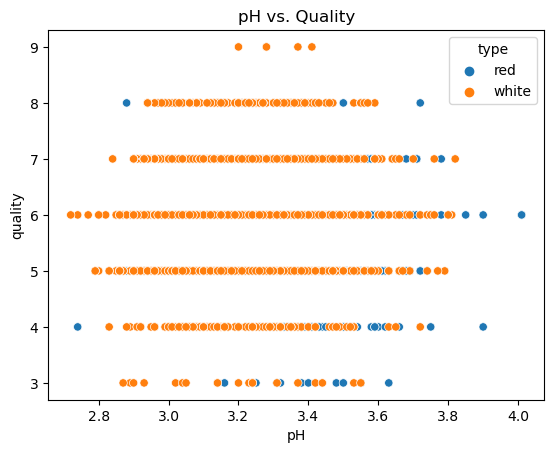

In [32]:
# Plot a scatter plot of pH vs. wine quality
sns.scatterplot(x='pH', y='quality', hue='type', data=df)
plt.title('pH vs. Quality')
plt.show()

In [33]:
from sklearn.ensemble import RandomForestRegressor
#from data_preparation import preprocess_data

In [34]:
# Preprocess the data
preprocess_data = df

In [35]:
processed_data = preprocess_data

In [36]:
processed_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,red
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,red
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,red
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,red
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,white
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,white
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,white
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,white


In [37]:
# Conduct one hot encoding on the 'type' column
encoded_data = pd.get_dummies(processed_data['type'], prefix='type')
processed_data = pd.concat([processed_data, encoded_data], axis=1)

# Drop the original 'type' column
processed_data.drop(['type'], axis=1, inplace=True)

# Train a random forest model
rf = RandomForestRegressor()
rf.fit(processed_data.drop('quality', axis=1), processed_data['quality'])

# Get feature importances
importances = rf.feature_importances_
features = processed_data.columns[:-1]# Update to grab the correct columns

# Create a DataFrame of feature importances
feature_importances = pd.DataFrame({'feature': features, 'importance': importances})
feature_importances.sort_values('importance', ascending=False, inplace=True)

In [38]:
processed_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1


In [39]:
mean_df

,quality,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7,red,8.87,0.40,0.38,2.72,0.08,14.05,35.02,1.00,3.29,0.74,11.47
1,7,white,6.73,0.26,0.33,5.19,0.04,34.13,125.11,0.99,3.21,0.50,11.37
2,8,red,8.57,0.42,0.39,2.58,0.07,13.28,33.44,1.00,3.27,0.77,12.09
3,8,white,6.66,0.28,0.33,5.67,0.04,36.72,126.17,0.99,3.22,0.49,11.64
4,9,white,7.42,0.30,0.39,4.12,0.03,33.40,116.00,0.99,3.31,0.47,12.18


In [40]:
processed_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1


In [41]:
#df = wrangle.drop_col_fraction(processed_data, 'type_white', frac=0.003)

In [42]:
df = wrangle.remove_outliers_iqr_loop(processed_data)

In [43]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
1600,6.30,0.30,0.34,1.60,0.05,14.00,132.00,0.99,3.30,0.49,9.50,6,0,1
1601,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
1602,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1603,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1604,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1


In [44]:
feature_importances

,feature,importance
10,alcohol,0.25
1,volatile acidity,0.13
5,free sulfur dioxide,0.09
9,sulphates,0.08
6,total sulfur dioxide,0.07
3,residual sugar,0.07
8,pH,0.07
4,chlorides,0.06
7,density,0.06
2,citric acid,0.06


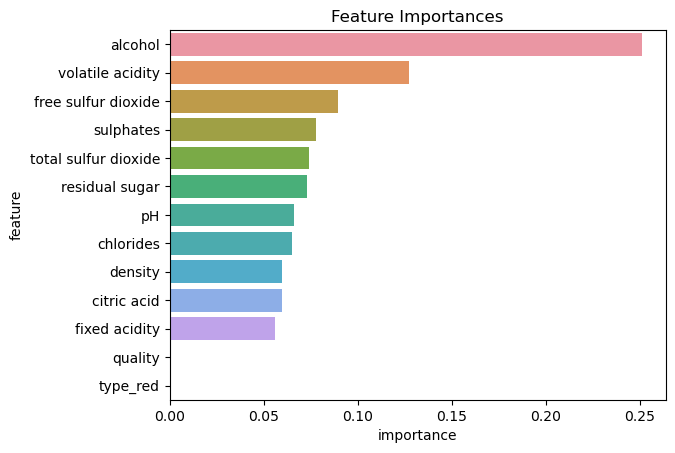

In [45]:
# Plot a bar chart of the feature importances
# Remove last four features
sns.barplot(x='importance', y='feature', data=feature_importances)
plt.title('Feature Importances')
plt.show()

In [46]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
1600,6.30,0.30,0.34,1.60,0.05,14.00,132.00,0.99,3.30,0.49,9.50,6,0,1
1601,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
1602,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1603,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1604,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1


In [47]:
df2 = df

In [48]:
df2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
1600,6.30,0.30,0.34,1.60,0.05,14.00,132.00,0.99,3.30,0.49,9.50,6,0,1
1601,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
1602,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1603,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1604,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1


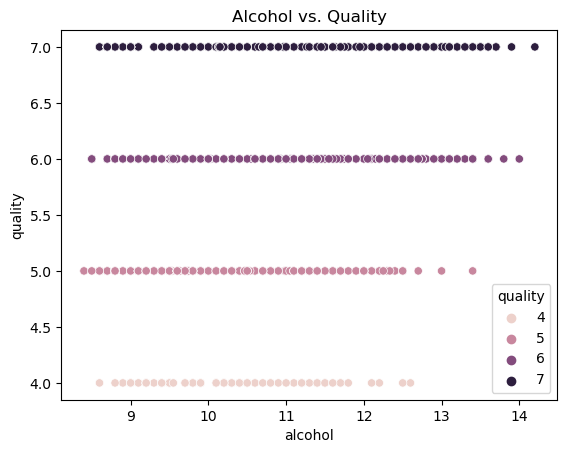

In [49]:
# Plot a scatter plot of alcohol content vs. wine quality
sns.scatterplot(x='alcohol', y='quality', hue='quality', data=df2)
plt.title('Alcohol vs. Quality')
plt.show()

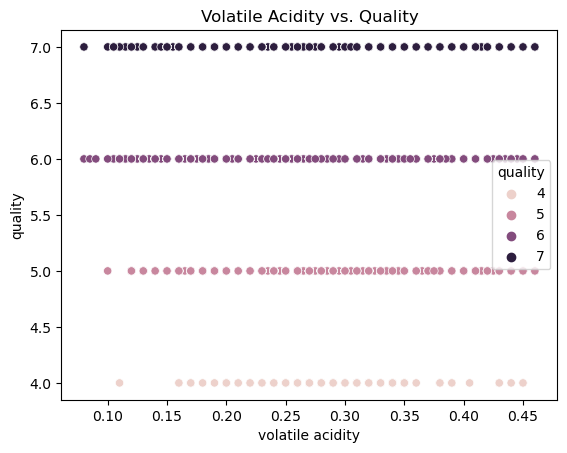

In [50]:
# Plot a scatter plot of volatile acidity vs. wine quality
sns.scatterplot(x='volatile acidity', y='quality', hue='quality', data=df2)
plt.title('Volatile Acidity vs. Quality')
plt.show()

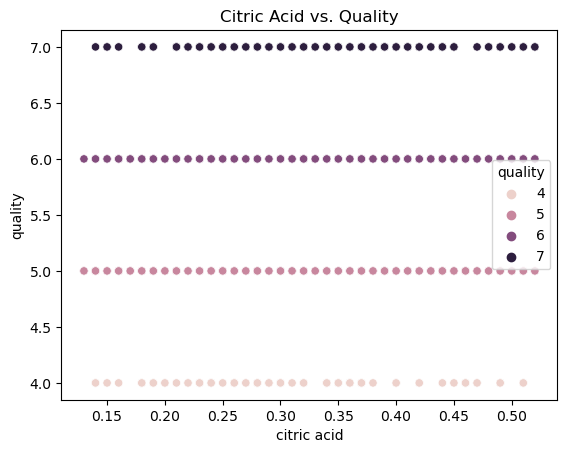

In [51]:
# Plot a scatter plot of citric acid vs. wine quality
sns.scatterplot(x='citric acid', y='quality',  hue='quality', data=df2)
plt.title('Citric Acid vs. Quality')
plt.show()

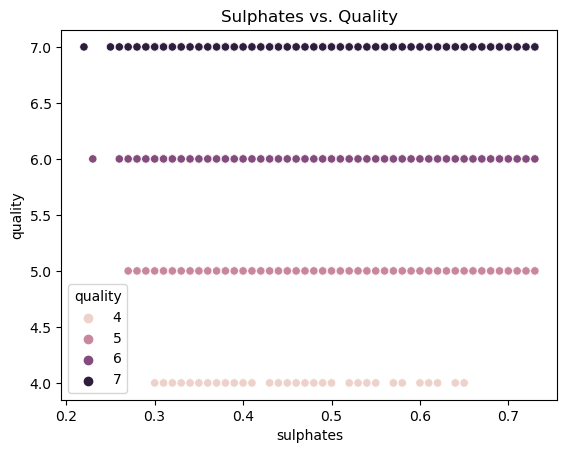

In [52]:
# Plot a scatter plot of sulphates vs. wine quality
sns.scatterplot(x='sulphates', y='quality', hue='quality', data=df2)
plt.title('Sulphates vs. Quality')
plt.show()

In [53]:
# Print the dataframe with the 'type' column added
df2.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
1600,6.30,0.30,0.34,1.60,0.05,14.00,132.00,0.99,3.30,0.49,9.50,6,0,1
1601,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
1602,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1603,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1604,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1


In [54]:
df2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
1600,6.30,0.30,0.34,1.60,0.05,14.00,132.00,0.99,3.30,0.49,9.50,6,0,1
1601,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
1602,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1603,7.20,0.23,0.32,8.50,0.06,47.00,186.00,1.00,3.19,0.40,9.90,6,0,1
1604,8.10,0.28,0.40,6.90,0.05,30.00,97.00,1.00,3.26,0.44,10.10,6,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1


In [55]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3658 entries, 1600 to 6496
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         3658 non-null   float64
 1   volatile acidity      3658 non-null   float64
 2   citric acid           3658 non-null   float64
 3   residual sugar        3658 non-null   float64
 4   chlorides             3658 non-null   float64
 5   free sulfur dioxide   3658 non-null   float64
 6   total sulfur dioxide  3658 non-null   float64
 7   density               3658 non-null   float64
 8   pH                    3658 non-null   float64
 9   sulphates             3658 non-null   float64
 10  alcohol               3658 non-null   float64
 11  quality               3658 non-null   int64  
 12  type_red              3658 non-null   uint8  
 13  type_white            3658 non-null   uint8  
dtypes: float64(11), int64(1), uint8(2)
memory usage: 378.7 KB


In [56]:
red_wines = df2[df2['type_red'] == 1]['quality']
white_wines = df2[df2['type_white'] == 1]['quality']

t_stat, p_value = ttest_ind(red_wines, white_wines, equal_var=False)

print('t-statistic:', t_stat)
print('p-value:', p_value)

t-statistic: nan
p-value: nan


In [57]:
# Perform a chi-squared test to compare the distribution of wine quality ratings between red and white wines
quality_counts = pd.crosstab(df2['quality'], df2['pH'])
chi2_stat, p_value, dof, expected = chi2_contingency(quality_counts)
print('Chi-squared statistic:', chi2_stat)
print('p-value:', p_value)

Chi-squared statistic: 366.95646479278173
p-value: 1.183108226076383e-10


In [58]:
quality_counts

pH,2.84,2.85,2.86,2.87,2.88,2.89,2.90,2.91,2.92,2.93,...,3.45,3.46,3.47,3.48,3.49,3.50,3.51,3.52,3.53,3.54
quality,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,1,0,0,2,0,0,...,0,1,1,0,1,0,0,1,0,0
5,0,2,1,3,0,5,2,0,3,3,...,4,5,3,2,1,7,0,3,2,1
6,0,0,5,2,10,8,5,6,5,10,...,4,10,11,10,11,6,4,8,2,5
7,1,0,0,0,0,0,16,2,4,5,...,7,8,2,4,5,1,5,3,2,6


> investigate the each quality

In [59]:
alcohol_counts = pd.crosstab(df2['quality'], df2['alcohol'])

In [60]:
alcohol_counts

alcohol,8.40,8.50,8.60,8.70,8.80,8.90,9.00,9.10,9.20,9.30,...,13.20,13.30,13.40,13.50,13.60,13.70,13.80,13.90,14.00,14.20
quality,,,,,,,,,,,,,,,,,,,,,
4,0,0,1,0,1,1,8,1,4,1,...,0,0,0,0,0,0,0,0,0,0
5,2,1,7,13,39,21,55,43,68,39,...,0,0,1,0,0,0,0,0,0,0
6,0,4,0,7,25,32,52,35,58,35,...,5,1,5,0,4,0,1,0,1,0
7,0,0,3,14,4,4,28,18,0,6,...,5,6,3,9,4,4,0,1,0,1


In [61]:
sulphates_counts = pd.crosstab(df2['quality'], df2['sulphates'])

In [62]:
sulphates_counts

sulphates,0.22,0.23,0.25,0.26,0.27,0.28,0.29,0.30,0.31,0.32,...,0.64,0.65,0.66,0.67,0.68,0.69,0.70,0.71,0.72,0.73
quality,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,1,3,1,...,2,2,0,0,0,0,0,0,0,0
5,0,0,0,0,1,2,2,1,5,7,...,7,5,7,6,9,3,4,2,5,3
6,0,1,0,1,7,3,6,9,14,12,...,24,8,15,14,16,10,10,6,10,1
7,1,0,1,1,2,2,2,11,9,14,...,15,8,7,3,10,9,4,5,11,5


In [63]:
fixed_acidity = pd.crosstab(df2['quality'], df2['fixed acidity'])

In [64]:
fixed_acidity

fixed acidity,4.80,4.90,5.00,5.10,5.20,5.30,5.40,5.50,5.60,5.70,...,7.90,8.00,8.10,8.20,8.30,8.40,8.50,8.60,8.70,8.80
quality,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,1,0,0,0,1,0,...,2,3,1,2,1,2,3,2,1,1
5,0,4,0,3,3,2,2,12,10,17,...,15,14,8,15,15,9,2,8,3,5
6,1,1,9,11,7,8,10,10,29,48,...,30,32,30,19,21,10,17,6,3,5
7,3,0,4,6,3,2,4,2,14,10,...,9,14,7,8,2,3,2,4,4,2


In [65]:
volatile_acidity = pd.crosstab(df2['quality'], df2['volatile acidity'])

In [66]:
volatile_acidity

volatile acidity,0.08,0.09,0.09,0.10,0.10,0.11,0.12,0.12,0.12,0.13,...,0.41,0.41,0.42,0.42,0.43,0.43,0.44,0.45,0.45,0.46
quality,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,2,0,1,0,2,0
5,0,0,0,1,0,0,0,7,0,4,...,16,2,10,1,6,0,9,0,5,8
6,2,1,1,1,2,6,2,11,1,18,...,12,0,12,1,13,2,10,2,2,6
7,2,0,0,1,4,3,1,7,2,9,...,7,1,6,0,4,0,13,0,4,6


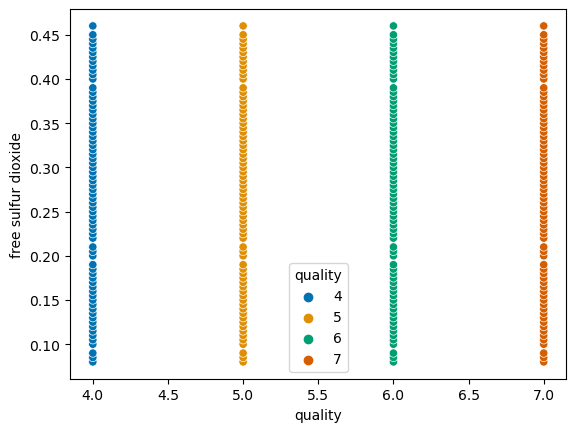

In [67]:
volatile_acidity = pd.crosstab(df2['quality'], df2['volatile acidity'])

# Reset the index and stack the columns to create a dataframe
volatile_acidity_df = volatile_acidity.reset_index().melt(id_vars=['quality'], var_name='free sulfur dioxide', value_name='count')

# Fit a k-means clustering model with 3 clusters
kmeans = KMeans(n_clusters=3).fit(volatile_acidity_df[['quality', 'count']])

# Add cluster labels to the dataframe
volatile_acidity_df['cluster'] = kmeans.labels_

# Create a scatterplot of free sulfur dioxide vs. quality, colored by cluster
sns.scatterplot(data=volatile_acidity_df, x='quality', y='free sulfur dioxide', hue='quality', palette='colorblind')
plt.show()

In [68]:
free_sulfur_dioxide = pd.crosstab(df2['quality'], df2['free sulfur dioxide'])

In [69]:
free_sulfur_dioxide 

free sulfur dioxide,2.00,3.00,4.00,5.00,6.00,7.00,8.00,9.00,10.00,11.00,...,68.00,69.00,70.00,71.00,72.00,73.00,73.50,74.00,75.00,76.00
quality,,,,,,,,,,,,,,,,,,,,,
4,0,3,1,6,5,3,2,6,2,2,...,0,1,0,0,0,0,0,0,1,0
5,1,3,2,6,9,7,8,5,17,18,...,7,3,1,3,1,0,0,1,1,0
6,0,1,5,3,5,7,10,7,19,9,...,11,7,3,2,4,7,0,3,2,1
7,0,0,0,0,0,1,3,3,2,4,...,0,0,0,0,0,1,2,0,0,0


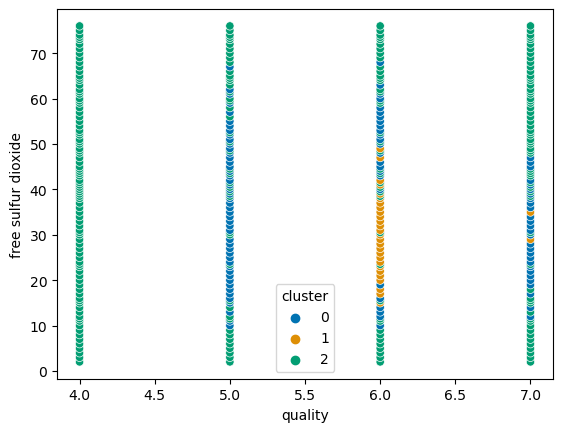

In [70]:
free_sulfur_dioxide = pd.crosstab(df2['quality'], df2['free sulfur dioxide'])

# Reset the index and stack the columns to create a dataframe
free_sulfur_dioxide_df = free_sulfur_dioxide.reset_index().melt(id_vars=['quality'], var_name='free sulfur dioxide', value_name='count')

# Fit a k-means clustering model with 3 clusters
kmeans = KMeans(n_clusters=3).fit(free_sulfur_dioxide_df[['quality', 'count']])

# Add cluster labels to the dataframe
free_sulfur_dioxide_df['cluster'] = kmeans.labels_

# Create a scatterplot of free sulfur dioxide vs. quality, colored by cluster
sns.scatterplot(data=free_sulfur_dioxide_df, x='quality', y='free sulfur dioxide', hue='cluster', palette='colorblind')
plt.show()


In [71]:
important_features = feature_importances[feature_importances['importance'] > 0.05]['feature'].tolist()
distinct_model = RandomForestRegressor(n_estimators=100, max_depth=5)

In [72]:
features = important_features

In [73]:
features

['alcohol',
 'volatile acidity',
 'free sulfur dioxide',
 'sulphates',
 'total sulfur dioxide',
 'residual sugar',
 'pH',
 'chlorides',
 'density',
 'citric acid',
 'fixed acidity']

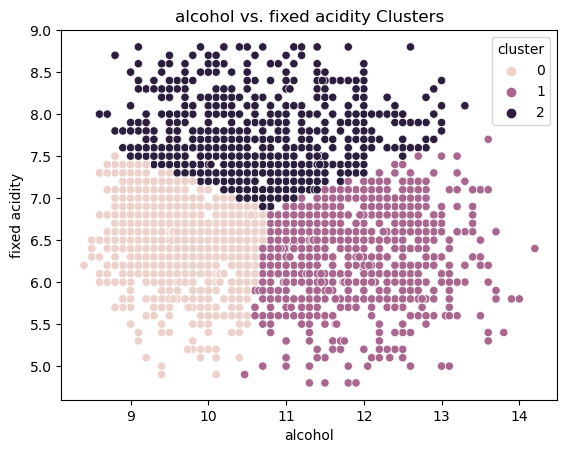

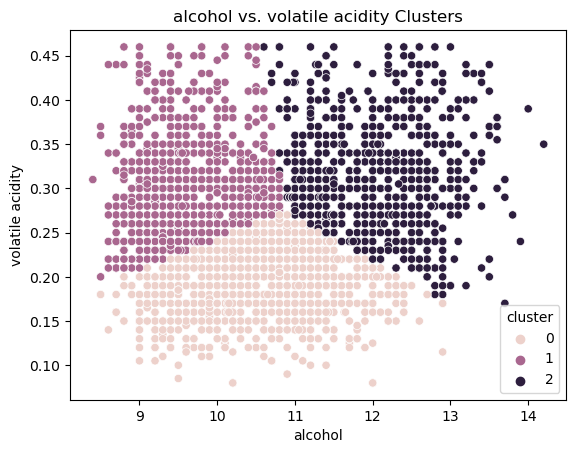

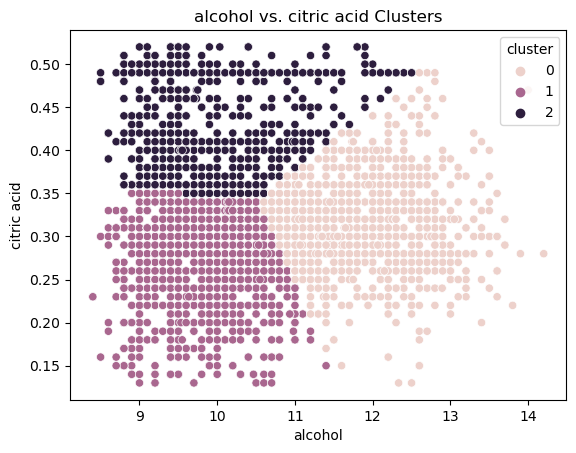

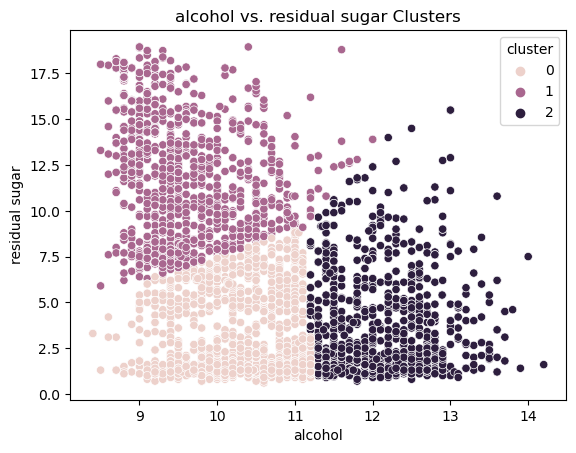

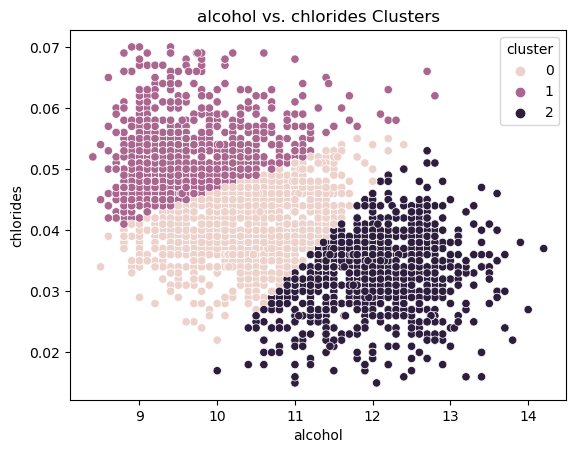

...

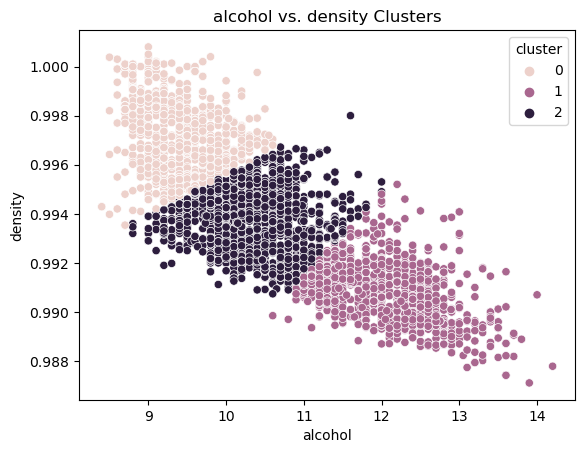

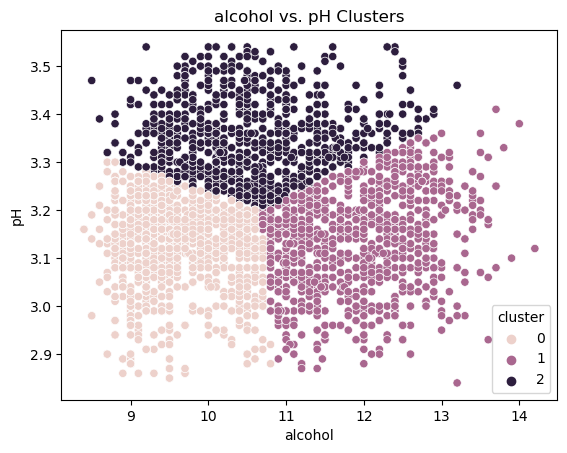

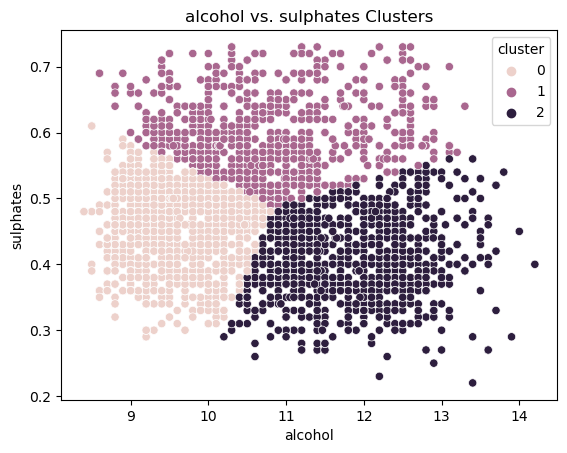

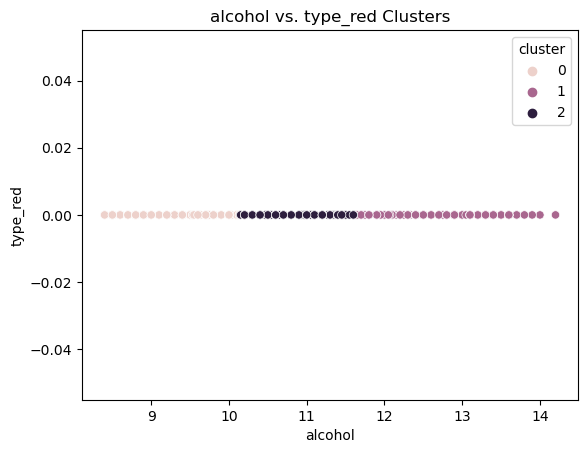

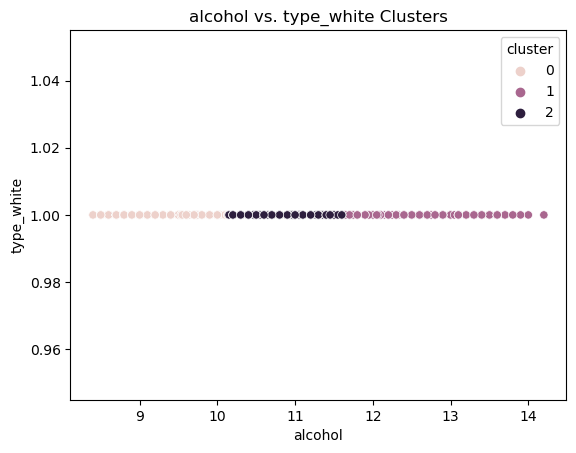

In [74]:
# Define the features and target variable
#features = df2.drop(['quality'], axis=1).columns


# Scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df2)

# Create a KMeans model with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_data)

# Add the cluster labels to the DataFrame
df2['cluster'] = kmeans.labels_

features = [col for col in df2.columns if col not in [ 'alcohol','quality', 'cluster']]

# Loop through each feature (excluding 'quality') and create a scatter plot of alcohol vs. the feature
for feature in features:
        # Create a DataFrame with the alcohol and feature columns
        clustering_data = df2[['alcohol', feature]]

        # Scale the data
        scaled_data = scaler.fit_transform(clustering_data)

        # Create a KMeans model with 3 clusters
        kmeans = KMeans(n_clusters=3, random_state=42)
        kmeans.fit(scaled_data)

        # Add the cluster labels to the DataFrame
        clustering_data['cluster'] = kmeans.labels_

        # Create a scatter plot of alcohol vs. the feature
        sns.scatterplot(x='alcohol', y=feature, hue='cluster', data=clustering_data)
        plt.title('alcohol vs. ' + feature + ' Clusters')
        plt.show()


In [75]:
clustering_data

,alcohol,type_white,cluster
1600,9.50,1,0
1601,10.10,1,0
1602,9.90,1,0
1603,9.90,1,0
1604,10.10,1,0
...,...,...,...
6492,11.20,1,2
6493,9.60,1,0
6494,9.40,1,0
6495,12.80,1,1


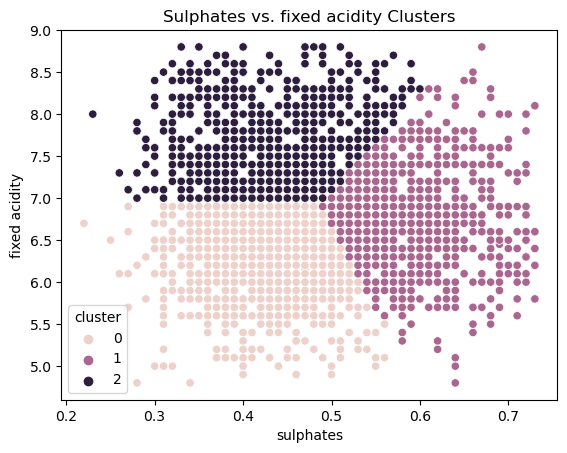

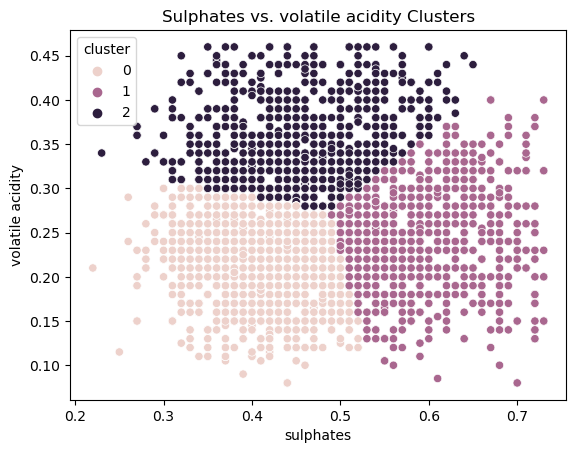

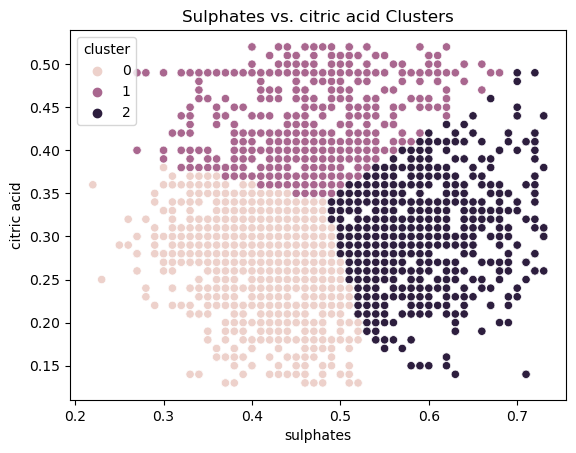

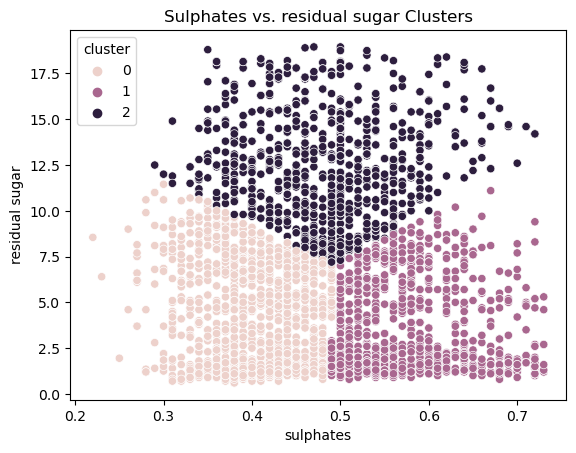

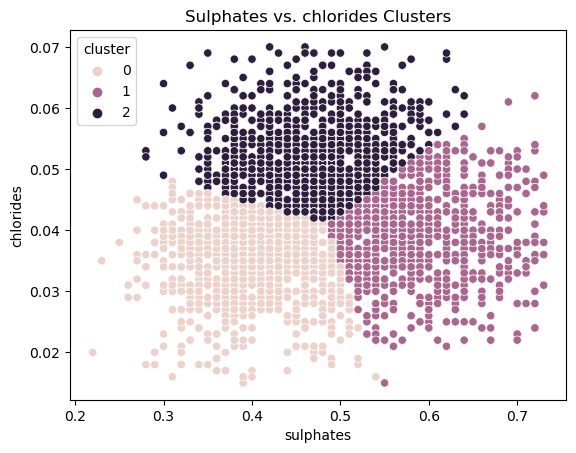

...

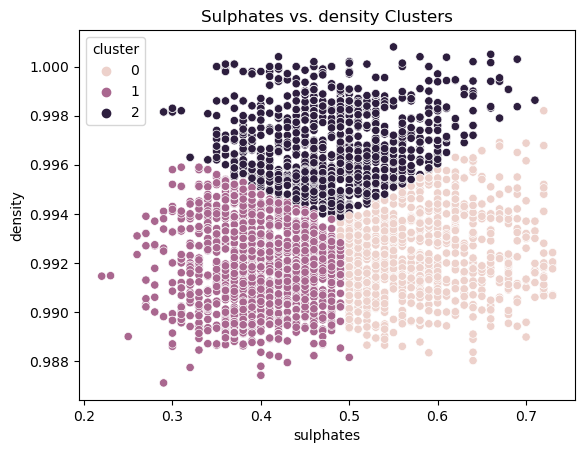

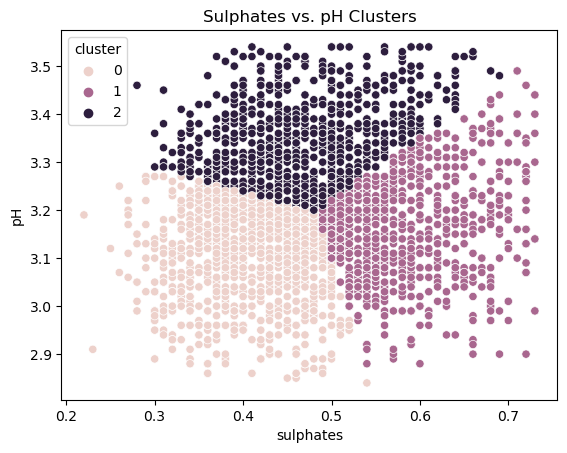

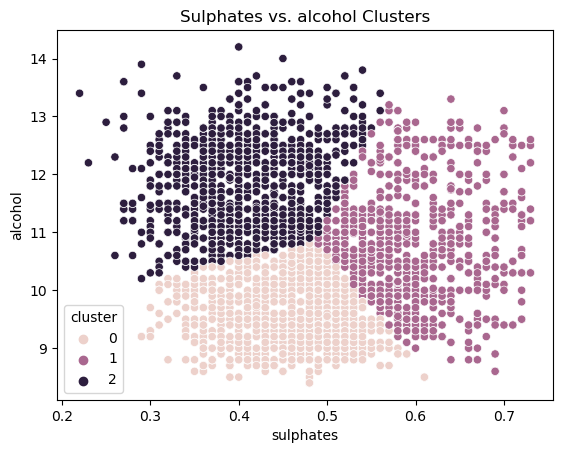

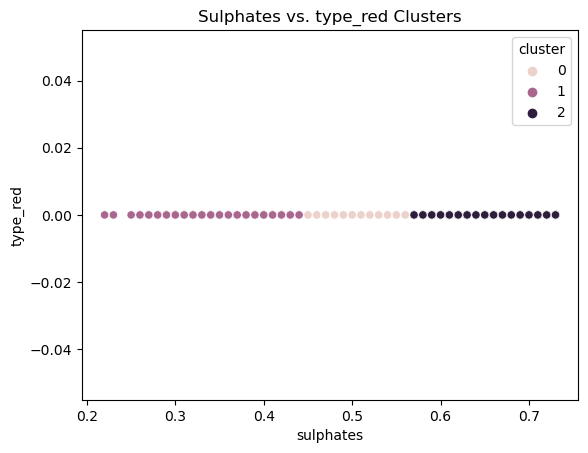

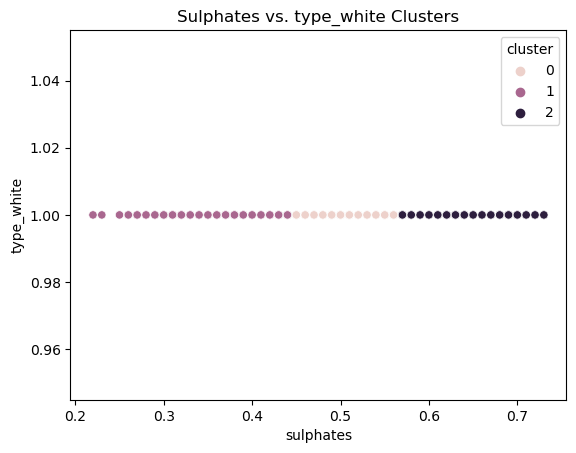

In [76]:
# Define the features and target variable
#features = df2.drop(['quality'], axis=1).columns

# Create a DataFrame with the alcohol column
df2[['sulphates']]

# Scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df2)

# Create a KMeans model with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_data)

# Add the cluster labels to the DataFrame
df2['cluster'] = kmeans.labels_

features = [col for col in df2.columns if col not in ['sulphates', 'quality', 'cluster']]

# Loop through each feature (excluding 'quality') and create a scatter plot of alcohol vs. the feature
for feature in features:
    if feature != 'quality':
        # Create a DataFrame with the alcohol and feature columns
        clustering_data = df2[['sulphates', feature]]

        # Scale the data
        scaled_data = scaler.fit_transform(clustering_data)

        # Create a KMeans model with 3 clusters
        kmeans = KMeans(n_clusters=3, random_state=42)
        kmeans.fit(scaled_data)

        # Add the cluster labels to the DataFrame
        clustering_data['cluster'] = kmeans.labels_

        # Create a scatter plot of alcohol vs. the feature
        sns.scatterplot(x='sulphates', y=feature, hue='cluster', data=clustering_data)
        plt.title('Sulphates vs. ' + feature + ' Clusters')
        plt.show()
# Stops on PH

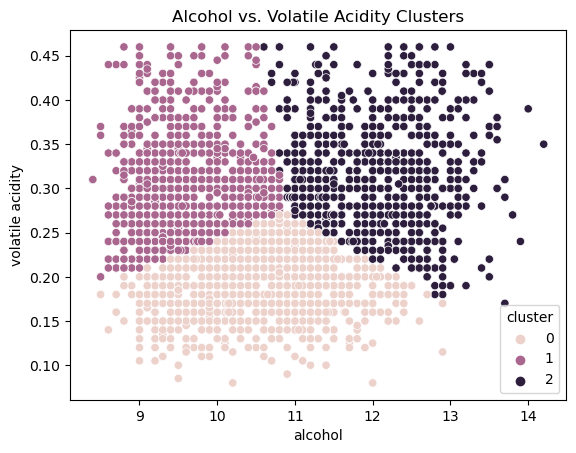

In [77]:
from sklearn.cluster import KMeans

# Create a DataFrame with the alcohol and volatile acidity columns
clustering_data = df2[['alcohol', 'volatile acidity']]

# Scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_data)

# Create a KMeans model with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_data)

# Add the cluster labels to the DataFrame
clustering_data['cluster'] = kmeans.labels_

# Plot the clusters
sns.scatterplot(x='alcohol', y='volatile acidity', hue='cluster', data=clustering_data)
plt.title('Alcohol vs. Volatile Acidity Clusters')
plt.show()

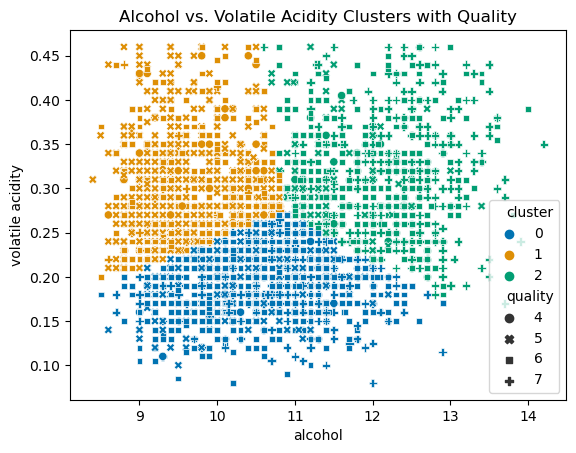

In [78]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Create a DataFrame with the alcohol and volatile acidity columns
clustering_data = df2[['alcohol', 'volatile acidity', 'quality']]

# Scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_data[['alcohol', 'volatile acidity']])

# Create a KMeans model with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_data)

# Add the cluster labels to the DataFrame
clustering_data['cluster'] = kmeans.labels_

# Plot the clusters with different color palette for each quality level
sns.scatterplot(x='alcohol', y='volatile acidity', hue='cluster', style='quality',
                data=clustering_data, palette='colorblind')
plt.title('Alcohol vs. Volatile Acidity Clusters with Quality')
plt.show()


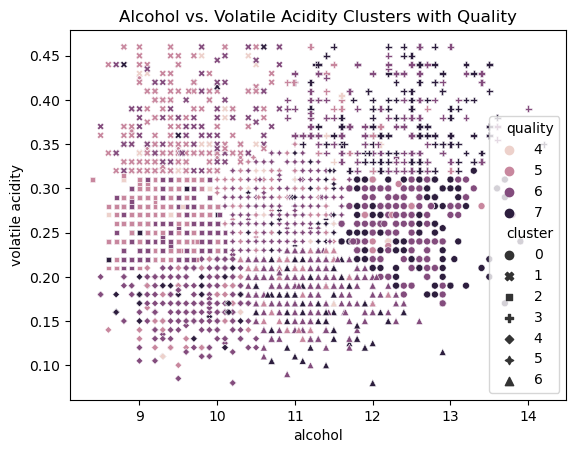

In [79]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Create a DataFrame with the alcohol and volatile acidity columns
clustering_data = df2[['alcohol', 'volatile acidity', 'quality']]

# Scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_data[['alcohol', 'volatile acidity']])

# Create a KMeans model with 3 clusters
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(scaled_data)

# Add the cluster labels to the DataFrame
clustering_data['cluster'] = kmeans.labels_

# Plot the clusters with different color palette for each quality level
sns.scatterplot(x='alcohol', y='volatile acidity', hue='quality', style='cluster',
                data=clustering_data, s=25)
plt.title('Alcohol vs. Volatile Acidity Clusters with Quality')
plt.show()


In [80]:
sulfate_data = sulphates_counts

In [81]:
sulfate_data

sulphates,0.22,0.23,0.25,0.26,0.27,0.28,0.29,0.30,0.31,0.32,...,0.64,0.65,0.66,0.67,0.68,0.69,0.70,0.71,0.72,0.73
quality,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,1,3,1,...,2,2,0,0,0,0,0,0,0,0
5,0,0,0,0,1,2,2,1,5,7,...,7,5,7,6,9,3,4,2,5,3
6,0,1,0,1,7,3,6,9,14,12,...,24,8,15,14,16,10,10,6,10,1
7,1,0,1,1,2,2,2,11,9,14,...,15,8,7,3,10,9,4,5,11,5


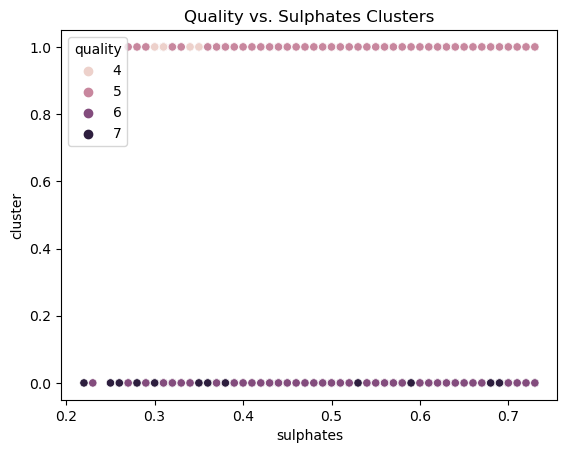

In [82]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# perform k-means clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(df2[['sulphates', 'quality']])

# add cluster labels to the DataFrame
df2['cluster'] = kmeans.labels_

# create scatter plot
sns.scatterplot(x='sulphates', y='cluster', hue='quality', data=df2)
plt.title('Quality vs. Sulphates Clusters')
plt.show()

In [83]:
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans

# Create a crosstab dataframe
df2_ct = pd.crosstab(df2['quality'], df2['sulphates'])

In [84]:
df2_ct 

sulphates,0.22,0.23,0.25,0.26,0.27,0.28,0.29,0.30,0.31,0.32,...,0.64,0.65,0.66,0.67,0.68,0.69,0.70,0.71,0.72,0.73
quality,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,1,3,1,...,2,2,0,0,0,0,0,0,0,0
5,0,0,0,0,1,2,2,1,5,7,...,7,5,7,6,9,3,4,2,5,3
6,0,1,0,1,7,3,6,9,14,12,...,24,8,15,14,16,10,10,6,10,1
7,1,0,1,1,2,2,2,11,9,14,...,15,8,7,3,10,9,4,5,11,5


In [85]:
from sklearn.cluster import KMeans

In [86]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

In [87]:
# Preprocess the data
df2 = processed_data
preprocess_data = processed_data

In [88]:
preprocess_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1


In [89]:
#Split the data into training, validation, and testing sets
train_data = processed_data.sample(frac=0.6, random_state=42)
val_data = processed_data.drop(train_data.index).sample(frac=0.5, random_state=42)
test_data = processed_data.drop(train_data.index).drop(val_data.index)

#Define the features and target variable
wine_features = processed_data.columns[:-1]
target = 'quality'

#Create the models

linear_model = LinearRegression()
tree_model = DecisionTreeRegressor(random_state=42)
forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
svm_model = SVR()

#Train the models

linear_model.fit(train_data[features], train_data[target])
tree_model.fit(train_data[features], train_data[target])
forest_model.fit(train_data[features], train_data[target])
svm_model.fit(train_data[features], train_data[target])

#Make predictions on the validation data

linear_pred_val = linear_model.predict(val_data[features])
tree_pred_val = tree_model.predict(val_data[features])
forest_pred_val = forest_model.predict(val_data[features])
svm_pred_val = svm_model.predict(val_data[features])

#Evaluate the models on validation data

linear_rmse_val = mean_squared_error(val_data[target], linear_pred_val, squared=False)
tree_rmse_val = mean_squared_error(val_data[target], tree_pred_val, squared=False)
forest_rmse_val = mean_squared_error(val_data[target], forest_pred_val, squared=False)
svm_rmse_val = mean_squared_error(val_data[target], svm_pred_val, squared=False)

linear_r2_val = r2_score(val_data[target], linear_pred_val)
tree_r2_val = r2_score(val_data[target], tree_pred_val)
forest_r2_val = r2_score(val_data[target], forest_pred_val)
svm_r2_val = r2_score(val_data[target], svm_pred_val)

# Make predictions on the test data
linear_pred_test = linear_model.predict(test_data[features])
tree_pred_test = tree_model.predict(test_data[features])
forest_pred_test = forest_model.predict(test_data[features])
svm_pred_test = svm_model.predict(test_data[features])

# Evaluate the models on the test set
linear_rmse_test = mean_squared_error(test_data[target], linear_pred_test, squared=False)
tree_rmse_test = mean_squared_error(test_data[target], tree_pred_test, squared=False)
forest_rmse_test = mean_squared_error(test_data[target], forest_pred_test, squared=False)
svm_rmse_test = mean_squared_error(test_data[target], svm_pred_test, squared=False)

linear_r2_test = r2_score(test_data[target], linear_pred_test)
tree_r2_test = r2_score(test_data[target], tree_pred_test)
forest_r2_test = r2_score(test_data[target], forest_pred_test)
svm_r2_test = r2_score(test_data[target], svm_pred_test)

print('Validation set performance, RSME:')
print('Linear Regression RMSE:', linear_rmse_val)
print('Decision Tree RMSE:', tree_rmse_val)
print('Random Forest RMSE:', forest_rmse_val)
print('Support Vector Regression RMSE:', svm_rmse_val)

print('\nValidation set performance, R^2:')
print('Linear Regression R^2 score:', linear_r2_val)
print('Decision Tree R^2 score:', tree_r2_val)
print('Random Forest R^2 score:', forest_r2_val)
print('Support Vector Regression R^2 score:', svm_r2_val)

print('\nTest set performance:')
print('Linear Regression RMSE:', linear_rmse_test)
print('Decision Tree RMSE:', tree_rmse_test)
print('Random Forest RMSE:', forest_rmse_test)
print('Support Vector Regression R^2 score:', svm_r2_test)

print('\nTest set performance, R2:')
print('Linear Regression R2:', linear_r2)
print('Decision Tree R2:', tree_r2)
print('Random Forest R2:', forest_r2)
print('Support Vector Regression R2:', svm_r2)


Validation set performance, RSME:
Linear Regression RMSE: 0.7450638580283335
Decision Tree RMSE: 0.8931362201211569
Random Forest RMSE: 0.6429914462883624
Support Vector Regression RMSE: 0.8183979547047419

Validation set performance, R^2:
Linear Regression R^2 score: 0.2612014009740554
Decision Tree R^2 score: -0.06163315577759643
Random Forest R^2 score: 0.4497634182681859
Support Vector Regression R^2 score: 0.10860921510518762

Test set performance:
Linear Regression RMSE: 0.7397526960438368
Decision Tree RMSE: 0.8986346670472332
Random Forest RMSE: 0.639424117830594
Support Vector Regression R^2 score: 0.1280978832979931

Test set performance, R2:


NameError: name 'linear_r2' is not defined

In [ ]:
wine_features

In [90]:
important_features

['alcohol',
 'volatile acidity',
 'free sulfur dioxide',
 'sulphates',
 'total sulfur dioxide',
 'residual sugar',
 'pH',
 'chlorides',
 'density',
 'citric acid',
 'fixed acidity']

Cluster 1 Mean Quality: 6.075736325385694
Cluster 2 Mean Quality: 5.755822159491884
Cluster 3 Mean Quality: 5.8162711864406775
ANOVA p-value: 1.9838412230814348e-17


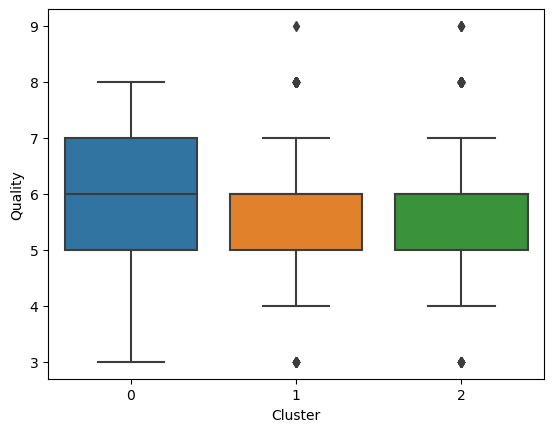

In [91]:
import pandas as pd
import numpy as np
from scipy.stats import f_oneway
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Define the features and target variable
X = df2[['sulphates']]
y = df2['quality']

# Fit a KMeans model to the data
model = KMeans(n_clusters=3)
clustering_data = df2.copy()
clustering_data['cluster'] = model.fit_predict(X)

# Print the mean quality for each cluster
for i in range(3):
    cluster_quality = df2.loc[clustering_data['cluster'] == i, 'quality']
    print('Cluster', i+1, 'Mean Quality:', cluster_quality.mean())

# Perform ANOVA on the quality values for each cluster
f_stat, p_value = f_oneway(df2.loc[clustering_data['cluster'] == 0, 'quality'],
                           df2.loc[clustering_data['cluster'] == 1, 'quality'],
                           df2.loc[clustering_data['cluster'] == 2, 'quality'])
print('ANOVA p-value:', p_value)

# Create boxplots of wine quality for each cluster
sns.boxplot(x=clustering_data['cluster'], y=df2['quality'])
plt.xlabel('Cluster')
plt.ylabel('Quality')
plt.show()


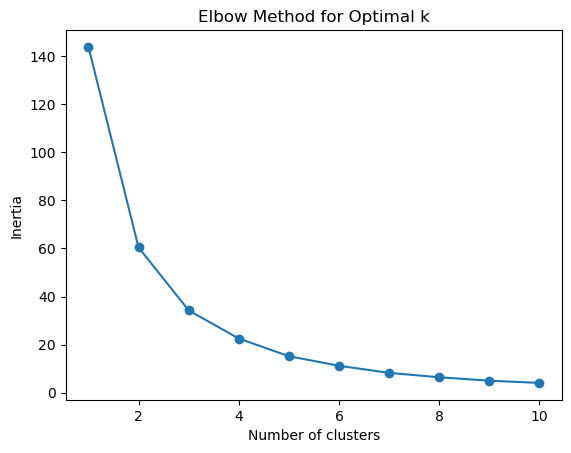

In [92]:
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

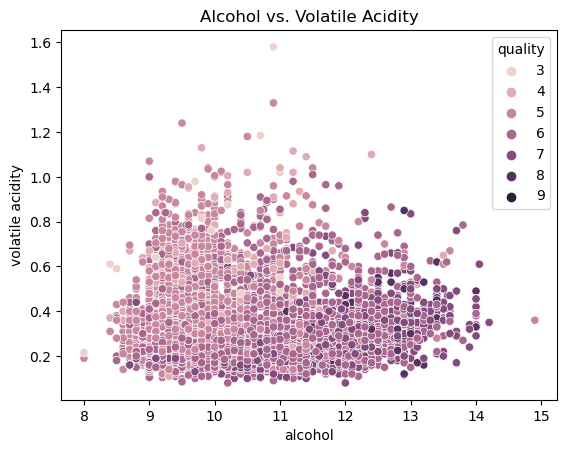

In [93]:
# Combination 1: Alcohol and volatile acidity
sns.scatterplot(x='alcohol', y='volatile acidity', hue='quality', data=df2)
plt.title('Alcohol vs. Volatile Acidity')
plt.show()

In [94]:
clustering_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,1
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0,1
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0,1
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0,1
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1,1
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1,2
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1,2
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1,2


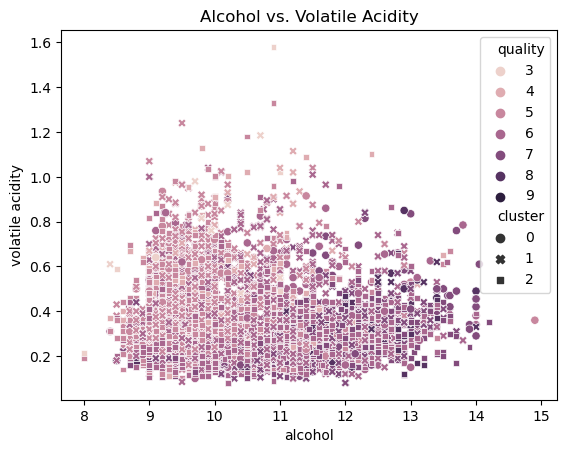

In [95]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assume we have a DataFrame 'df2' with columns 'alcohol', 'volatile acidity', 'quality', and 'cluster'

sns.scatterplot(x='alcohol', y='volatile acidity', hue='quality', style='cluster', data=clustering_data)
plt.title('Alcohol vs. Volatile Acidity')
plt.show()

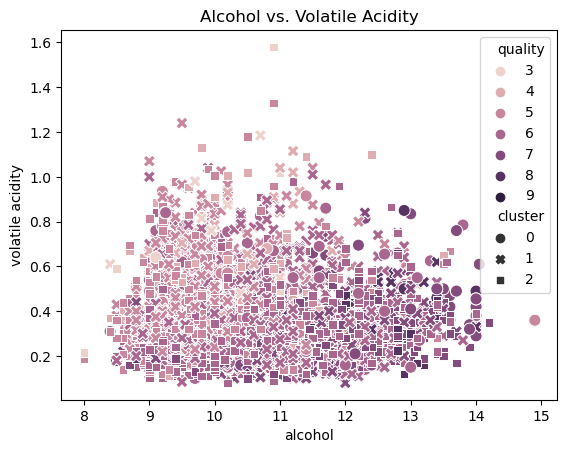

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assume we have a DataFrame 'clustering_data' with columns 'alcohol', 'volatile acidity', 'quality', and 'cluster'
cluster_labels = clustering_data['cluster'].unique()

# Plot the scatter plot
scatter = sns.scatterplot(x='alcohol', y='volatile acidity', hue='quality', style='cluster', data=clustering_data, legend='brief', s=75)

plt.title('Alcohol vs. Volatile Acidity')
plt.show()

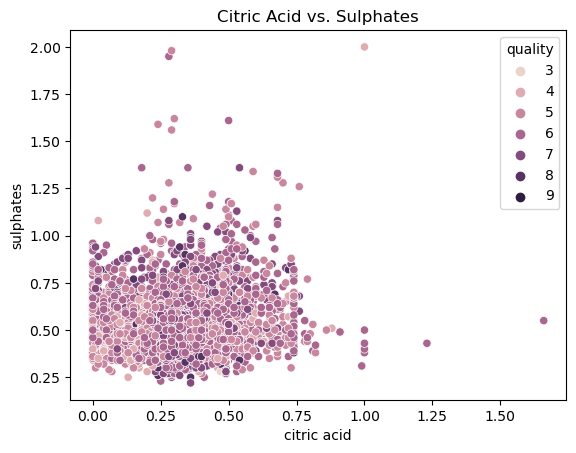

In [97]:
# Combination 2: Citric acid and sulphates
sns.scatterplot(x='citric acid', y='sulphates', hue='quality', data=clustering_data)
plt.title('Citric Acid vs. Sulphates')
plt.show()

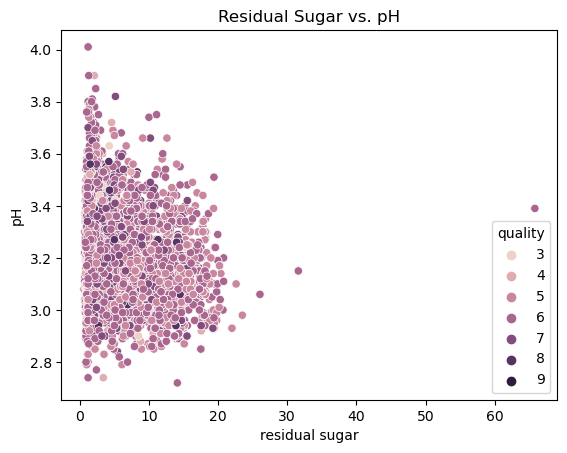

In [98]:
# Combination 3: Residual sugar and pH
sns.scatterplot(x='residual sugar', y='pH', hue='quality', data=clustering_data)
plt.title('Residual Sugar vs. pH')
plt.show()

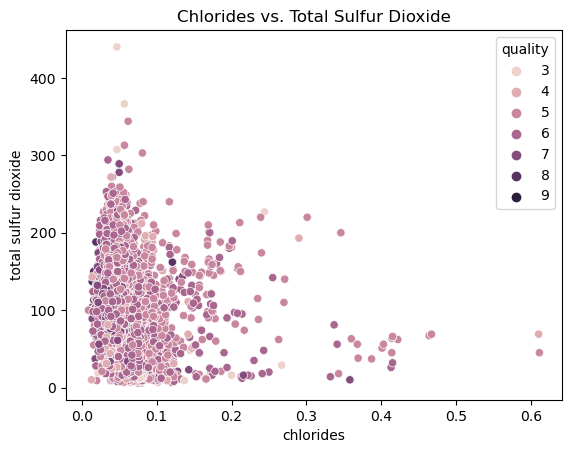

In [99]:
# Combination 4: Chlorides and total sulfur dioxide
sns.scatterplot(x='chlorides', y='total sulfur dioxide', hue='quality', data=clustering_data)
plt.title('Chlorides vs. Total Sulfur Dioxide')
plt.show()

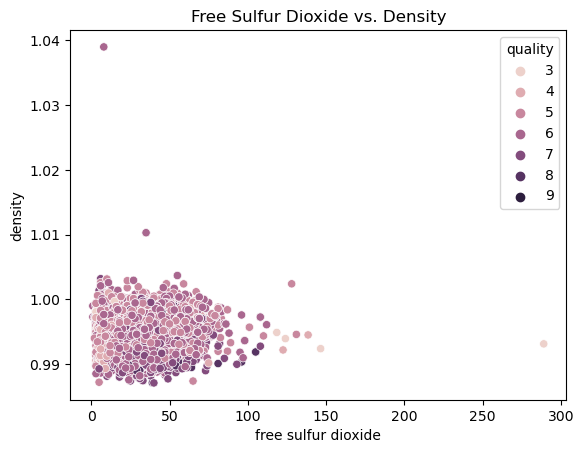

In [100]:
# Combination 5: Free sulfur dioxide and density
sns.scatterplot(x='free sulfur dioxide', y='density', hue='quality', data=clustering_data)
plt.title('Free Sulfur Dioxide vs. Density')
plt.show()

In [101]:
# assign the cluster labels to the DataFrame
df2['cluster'] = kmeans.labels_

In [102]:
df2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,4
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0,1
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0,1
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0,5
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1,4
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1,0
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1,0
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1,8


In [103]:
cluster_quality = df2.groupby('cluster')['quality'].mean()
cluster_quality

cluster
0                   5.71
1                   5.91
2                   5.90
3                   5.61
4                   5.69
5                   5.79
6                   6.12
7                   5.25
8                   5.89
9                   6.16
Name: quality, dtype: float64

In [104]:
best_cluster = cluster_quality.idxmax()
print("Cluster {} has the best quality scores.".format(best_cluster))

Cluster 9 has the best quality scores.


In [105]:
best_cluster_data = df2.loc[df2['cluster'] == best_cluster]

In [106]:
best_cluster_data 

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster
9,7.50,0.50,0.36,6.10,0.07,17.00,102.00,1.00,3.35,0.80,10.50,5,1,0,9
11,7.50,0.50,0.36,6.10,0.07,17.00,102.00,1.00,3.35,0.80,10.50,5,1,0,9
16,8.50,0.28,0.56,1.80,0.09,35.00,103.00,1.00,3.30,0.75,10.50,7,1,0,9
39,7.30,0.45,0.36,5.90,0.07,12.00,87.00,1.00,3.33,0.83,10.50,5,1,0,9
40,7.30,0.45,0.36,5.90,0.07,12.00,87.00,1.00,3.33,0.83,10.50,5,1,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6216,5.20,0.50,0.18,2.00,0.04,23.00,129.00,0.99,3.36,0.77,13.40,7,0,1,9
6325,6.30,0.48,0.48,1.80,0.04,35.00,96.00,0.99,3.49,0.74,12.20,6,0,1,9
6352,5.50,0.16,0.26,1.50,0.03,35.00,100.00,0.99,3.43,0.77,12.00,6,0,1,9
6426,6.70,0.22,0.33,1.20,0.04,36.00,86.00,0.99,3.10,0.76,11.40,6,0,1,9


In [107]:
# define columns to drop
columns_to_drop = ['cluster','total sulfur dioxide', 'density', 'fixed acidity', 'chlorides', 'sulphates', 'citric acid']

In [108]:
# drop columns from best_cluster_data
best_cluster_data.drop(columns_to_drop, axis=1, inplace=True)

In [109]:
best_cluster_data

,volatile acidity,residual sugar,free sulfur dioxide,pH,alcohol,quality,type_red,type_white
9,0.50,6.10,17.00,3.35,10.50,5,1,0
11,0.50,6.10,17.00,3.35,10.50,5,1,0
16,0.28,1.80,35.00,3.30,10.50,7,1,0
39,0.45,5.90,12.00,3.33,10.50,5,1,0
40,0.45,5.90,12.00,3.33,10.50,5,1,0
...,...,...,...,...,...,...,...,...
6216,0.50,2.00,23.00,3.36,13.40,7,0,1
6325,0.48,1.80,35.00,3.49,12.20,6,0,1
6352,0.16,1.50,35.00,3.43,12.00,6,0,1
6426,0.22,1.20,36.00,3.10,11.40,6,0,1


In [110]:
# Define the features and target variable
features = best_cluster_data

In [111]:
features

,volatile acidity,residual sugar,free sulfur dioxide,pH,alcohol,quality,type_red,type_white
9,0.50,6.10,17.00,3.35,10.50,5,1,0
11,0.50,6.10,17.00,3.35,10.50,5,1,0
16,0.28,1.80,35.00,3.30,10.50,7,1,0
39,0.45,5.90,12.00,3.33,10.50,5,1,0
40,0.45,5.90,12.00,3.33,10.50,5,1,0
...,...,...,...,...,...,...,...,...
6216,0.50,2.00,23.00,3.36,13.40,7,0,1
6325,0.48,1.80,35.00,3.49,12.20,6,0,1
6352,0.16,1.50,35.00,3.43,12.00,6,0,1
6426,0.22,1.20,36.00,3.10,11.40,6,0,1


In [112]:
features.describe()

,volatile acidity,residual sugar,free sulfur dioxide,pH,alcohol,quality,type_red,type_white
count,379.00,379.00,379.00,379.00,379.00,379.00,379.00,379.00
mean,0.36,4.17,26.06,3.27,10.82,6.16,0.62,0.38
std,0.16,4.08,18.43,0.16,1.27,0.83,0.49,0.49
min,0.10,0.90,3.00,2.86,8.40,3.00,0.00,0.00
25%,0.23,1.90,11.00,3.17,9.80,6.00,0.00,0.00
50%,0.34,2.30,22.00,3.28,10.80,6.00,1.00,0.00
75%,0.46,4.35,35.00,3.37,11.70,7.00,1.00,1.00
max,0.86,17.80,108.00,3.75,14.90,8.00,1.00,1.00


In [113]:
# Define the features and target variable
#features = best_cluster_data.drop(['quality'], axis=1)

In [114]:
# Add the new feature to the feature set

# Define X and y
X = features
y = features['quality']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Fit a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model using mean squared error and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean squared error:", mse)
print("R-squared:", r2)

Mean squared error: 4.387173806229136e-30
R-squared: 1.0


In [115]:
# Split the data into train, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(
    best_cluster_data.drop('quality', axis=1),
    best_cluster_data['quality'], 
    test_size=0.2, 
    random_state=42
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, 
    y_train, 
    test_size=0.25, 
    random_state=42
)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Fit the model on train set
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Evaluate on train set
train_pred = model.predict(X_train_scaled)
train_score = r2_score(y_train, train_pred)
print('Train R^2 score:', train_score)

# Evaluate on validation set
val_pred = model.predict(X_val_scaled)
val_score = r2_score(y_val, val_pred)
print('Validation R^2 score:', val_score)

# Evaluate on test set
test_pred = model.predict(X_test_scaled)
test_score = r2_score(y_test, test_pred)
print('Test R^2 score:', test_score)

Train R^2 score: 0.28419151729393244
Validation R^2 score: 0.10777930512260425
Test R^2 score: 0.25012752816625194


In [116]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


# Define the features and target variable
X = df2[['alcohol', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'quality']]
y = df2['quality']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Fit a linear regression model to the training data
lr = LinearRegression()
lr.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = lr.predict(X_test)

# Evaluate the model using mean squared error
mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

# Create a report on the different chemical compositions of wine
coefficients = pd.DataFrame(lr.coef_, X.columns, columns=['Coefficient'])
print('Regression Coefficients:')
print(coefficients)

# Compare the different chemical compositions of wine
#mean_quality = df2.groupby('quality')[['alcohol', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates']].mean()
#print('Mean Chemical Composition by Wine Quality:')


Mean Squared Error: 3.38551793797216e-29
Regression Coefficients:
                              Coefficient
alcohol                              0.00
volatile acidity                    -0.00
citric acid                          0.00
residual sugar                       0.00
chlorides                            0.00
free sulfur dioxide                 -0.00
total sulfur dioxide                 0.00
density                             -0.00
pH                                   0.00
sulphates                            0.00
quality                              1.00


In [117]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Define the features and target variable
X = df2[['sulphates']]
y = df2['quality']

# Define the number of clusters to try
k_range = range(3, 13)

# Iterate over the number of clusters and fit KMeans models to the data
best_model = None
best_score = -1
for k in k_range:
    model = KMeans(n_clusters=k)
    model.fit(X)
    score = silhouette_score(X, model.labels_)
    if score > best_score:
        best_score = score
        best_model = model
    print('Number of Clusters:', k, 'Silhouette Score:', score)

# Print the best model found and its clusters
print('Best Model Found:')
print(best_model)
print('Cluster Centers:')
print(best_model.cluster_centers_)

# Assign a cluster to each data point and print the counts of each cluster
df2['cluster'] = best_model.predict(X)
print('Cluster Counts:')
print(df2['cluster'].value_counts())

# Calculate the mean quality for each cluster
quality_means = df2.groupby('cluster')['quality'].mean()
print('Mean Quality for Each Cluster:')
quality_means

Number of Clusters: 3 Silhouette Score: 0.5475955624931733
Number of Clusters: 4 Silhouette Score: 0.5437942563369688
Number of Clusters: 5 Silhouette Score: 0.5410198199897144
Number of Clusters: 6 Silhouette Score: 0.537226677136294
Number of Clusters: 7 Silhouette Score: 0.53716064287534
Number of Clusters: 8 Silhouette Score: 0.5366704549393965
Number of Clusters: 9 Silhouette Score: 0.5407368195939435
Number of Clusters: 10 Silhouette Score: 0.521442406498895
Number of Clusters: 11 Silhouette Score: 0.5255482057551988
Number of Clusters: 12 Silhouette Score: 0.5364799293190946
Best Model Found:
KMeans(n_clusters=3)
Cluster Centers:
[[0.57596683]
 [0.4156339 ]
 [0.83203366]]
Cluster Counts:
1    2950
0    2834
2     713
Name: cluster, dtype: int64
Mean Quality for Each Cluster:


cluster
0                   5.76
1                   5.82
2                   6.08
Name: quality, dtype: float64

In [118]:
df2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,0
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0,0
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0,0
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0,0
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1,0
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1,1


In [119]:
df3 = df2

In [120]:
df3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,0
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0,0
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0,0
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0,0
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1,0
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1,1
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1,1
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1,1


In [121]:
# create new feature
df3['alcohol_pH'] = df3['alcohol'] * df3['pH']
# Create new feature that is the sum of 'free sulfur dioxide' and 'total sulfur dioxide'
df3['sulfur dioxide'] = df3['free sulfur dioxide'] + df3['total sulfur dioxide']

In [122]:
df3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster,alcohol_pH,sulfur dioxide
0,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,0,32.99,45.00
1,7.80,0.88,0.00,2.60,0.10,25.00,67.00,1.00,3.20,0.68,9.80,5,1,0,0,31.36,92.00
2,7.80,0.76,0.04,2.30,0.09,15.00,54.00,1.00,3.26,0.65,9.80,5,1,0,0,31.95,69.00
3,11.20,0.28,0.56,1.90,0.07,17.00,60.00,1.00,3.16,0.58,9.80,6,1,0,0,30.97,77.00
4,7.40,0.70,0.00,1.90,0.08,11.00,34.00,1.00,3.51,0.56,9.40,5,1,0,0,32.99,45.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.20,0.21,0.29,1.60,0.04,24.00,92.00,0.99,3.27,0.50,11.20,6,0,1,0,36.62,116.00
6493,6.60,0.32,0.36,8.00,0.05,57.00,168.00,0.99,3.15,0.46,9.60,5,0,1,1,30.24,225.00
6494,6.50,0.24,0.19,1.20,0.04,30.00,111.00,0.99,2.99,0.46,9.40,6,0,1,1,28.11,141.00
6495,5.50,0.29,0.30,1.10,0.02,20.00,110.00,0.99,3.34,0.38,12.80,7,0,1,1,42.75,130.00


In [123]:
from sklearn.preprocessing import StandardScaler

# create a new DataFrame with the numerical features
numeric_features = df3[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
                       'pH', 'sulphates', 'alcohol','alcohol_pH','sulfur dioxide']]

# scale the numerical features using the StandardScaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(numeric_features)

# replace the original features with the scaled features in the DataFrame
df3[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
    'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','alcohol_pH','sulfur dioxide',
    'pH', 'sulphates', 'alcohol']] = scaled_features

In [124]:
scaled_features = df3

In [125]:
df3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster,alcohol_pH,sulfur dioxide
0,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
1,0.45,3.28,-2.19,-0.60,1.20,-0.31,-0.86,0.70,-0.58,-0.56,-0.77,5,1,0,0,-0.12,1.00
2,0.45,2.55,-1.92,-0.66,1.03,-0.87,-1.09,0.77,-0.58,-0.42,-1.10,5,1,0,0,0.26,0.80
3,3.07,-0.36,1.66,-0.74,0.54,-0.76,-0.99,1.10,-0.58,-0.65,-0.98,6,1,0,0,-0.36,0.33
4,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,-0.78,-0.79,-0.20,-0.81,-0.49,-0.37,-0.42,-1.19,0.59,0.65,-0.43,6,0,1,0,0.32,-0.21
6493,-0.47,-0.12,0.28,0.54,-0.26,1.49,0.92,0.07,-0.75,-0.81,1.12,5,0,1,1,-0.43,-0.48
6494,-0.55,-0.61,-0.89,-0.89,-0.43,-0.03,-0.08,-0.72,-0.92,-1.30,-0.07,6,0,1,1,-1.42,-0.48
6495,-1.32,-0.30,-0.13,-0.91,-0.97,-0.59,-0.10,-2.00,1.94,2.05,-0.23,7,0,1,1,0.76,-1.02


In [126]:
df3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster,alcohol_pH,sulfur dioxide
0,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
1,0.45,3.28,-2.19,-0.60,1.20,-0.31,-0.86,0.70,-0.58,-0.56,-0.77,5,1,0,0,-0.12,1.00
2,0.45,2.55,-1.92,-0.66,1.03,-0.87,-1.09,0.77,-0.58,-0.42,-1.10,5,1,0,0,0.26,0.80
3,3.07,-0.36,1.66,-0.74,0.54,-0.76,-0.99,1.10,-0.58,-0.65,-0.98,6,1,0,0,-0.36,0.33
4,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,-0.78,-0.79,-0.20,-0.81,-0.49,-0.37,-0.42,-1.19,0.59,0.65,-0.43,6,0,1,0,0.32,-0.21
6493,-0.47,-0.12,0.28,0.54,-0.26,1.49,0.92,0.07,-0.75,-0.81,1.12,5,0,1,1,-0.43,-0.48
6494,-0.55,-0.61,-0.89,-0.89,-0.43,-0.03,-0.08,-0.72,-0.92,-1.30,-0.07,6,0,1,1,-1.42,-0.48
6495,-1.32,-0.30,-0.13,-0.91,-0.97,-0.59,-0.10,-2.00,1.94,2.05,-0.23,7,0,1,1,0.76,-1.02


In [127]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, LinearRegression

In [128]:
# Conduct one hot encoding on the 'type' column
#df3 = pd.get_dummies(processed_data['type_white'], prefix='type_red')
processed_data = pd.concat([processed_data, df3], axis=1)

In [129]:
df3 = processed_data 

In [130]:
df3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster,alcohol_pH,sulfur dioxide
0,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,...,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
1,0.45,3.28,-2.19,-0.60,1.20,-0.31,-0.86,0.70,-0.58,-0.56,...,0.70,-0.58,-0.56,-0.77,5,1,0,0,-0.12,1.00
2,0.45,2.55,-1.92,-0.66,1.03,-0.87,-1.09,0.77,-0.58,-0.42,...,0.77,-0.58,-0.42,-1.10,5,1,0,0,0.26,0.80
3,3.07,-0.36,1.66,-0.74,0.54,-0.76,-0.99,1.10,-0.58,-0.65,...,1.10,-0.58,-0.65,-0.98,6,1,0,0,-0.36,0.33
4,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,...,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,-0.78,-0.79,-0.20,-0.81,-0.49,-0.37,-0.42,-1.19,0.59,0.65,...,-1.19,0.59,0.65,-0.43,6,0,1,0,0.32,-0.21
6493,-0.47,-0.12,0.28,0.54,-0.26,1.49,0.92,0.07,-0.75,-0.81,...,0.07,-0.75,-0.81,1.12,5,0,1,1,-0.43,-0.48
6494,-0.55,-0.61,-0.89,-0.89,-0.43,-0.03,-0.08,-0.72,-0.92,-1.30,...,-0.72,-0.92,-1.30,-0.07,6,0,1,1,-1.42,-0.48
6495,-1.32,-0.30,-0.13,-0.91,-0.97,-0.59,-0.10,-2.00,1.94,2.05,...,-2.00,1.94,2.05,-0.23,7,0,1,1,0.76,-1.02


In [131]:
# Separate the features and target variable
X = df3.drop(['quality'], axis=1)
y = df3['quality']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Split the training data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=42)

In [132]:
df3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,density,pH,sulphates,alcohol,quality,type_red,type_white,cluster,alcohol_pH,sulfur dioxide
0,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,...,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
1,0.45,3.28,-2.19,-0.60,1.20,-0.31,-0.86,0.70,-0.58,-0.56,...,0.70,-0.58,-0.56,-0.77,5,1,0,0,-0.12,1.00
2,0.45,2.55,-1.92,-0.66,1.03,-0.87,-1.09,0.77,-0.58,-0.42,...,0.77,-0.58,-0.42,-1.10,5,1,0,0,0.26,0.80
3,3.07,-0.36,1.66,-0.74,0.54,-0.76,-0.99,1.10,-0.58,-0.65,...,1.10,-0.58,-0.65,-0.98,6,1,0,0,-0.36,0.33
4,0.14,2.19,-2.19,-0.74,0.57,-1.10,-1.45,1.03,-0.92,-0.18,...,1.03,-0.92,-0.18,-1.44,5,1,0,0,1.81,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,-0.78,-0.79,-0.20,-0.81,-0.49,-0.37,-0.42,-1.19,0.59,0.65,...,-1.19,0.59,0.65,-0.43,6,0,1,0,0.32,-0.21
6493,-0.47,-0.12,0.28,0.54,-0.26,1.49,0.92,0.07,-0.75,-0.81,...,0.07,-0.75,-0.81,1.12,5,0,1,1,-0.43,-0.48
6494,-0.55,-0.61,-0.89,-0.89,-0.43,-0.03,-0.08,-0.72,-0.92,-1.30,...,-0.72,-0.92,-1.30,-0.07,6,0,1,1,-1.42,-0.48
6495,-1.32,-0.30,-0.13,-0.91,-0.97,-0.59,-0.10,-2.00,1.94,2.05,...,-2.00,1.94,2.05,-0.23,7,0,1,1,0.76,-1.02
